# Insurance Claim Fraud Detection

# 1. Introduction

# Project Description
Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.
In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made. 
In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not. 


# Dataset Attributes

1. months_as_customer: Number of months of patronage
2. age: The length of time a customer has lived or a thing has existed
3. policy_number: Unique id given to the customer to track subscription status and other details
4. policy_bind_date: Date document given to customer after insurance proposal acceptance
5. policy_state: Identifies insured, covered risks, policy limits, and period
6. policy_csl: Combined Single Limit
7. policy_deductable: Amount customer is responsible for toward an insured loss
8. policy_annual_premium: Regular Premium payable by Policyholder in a Policy Year
9. umbrella_limit: Extra insurance providing protection beyond existing limits
10. insured_zip: Zip code where insurance was made
11. insured_sex: Categories of male and female based on reproductive functions
12. insured_education_level: Level of education of the customer
13. insured_occupation: Occupation of the customer
14. insured_hobbies: Activity done regularly by customer for pleasure
15. insured_relationship: Relationship status of customer
16. capital-gains: Profit accrued due to insurance premium
17. capital-loss: Losses incurred due to insurance claims
18. incident_date: Date when claims were made by customers
19. incident_type: Type of claim/vehicle damage made by customer
20. collision_type: Area of damage on the vehicle
21. incident_severity: Extent/level of damage
22. authorities_contacted: Government agencies contacted after damage
23. incident_state: State where the accident happened
24. incident_city: City where the accident happened
25. incident_location: Location where the accident happened
26. incident_hour_of_the_day: Period of the day the accident took place
27. number_of_vehicles_involved: Number of vehicles involved in the accident
28. property_damage: Whether property was damaged or not
29. bodily_injuries: Injuries sustained
30. witnesses: Number of witnesses involved
31. police_report_available: Whether the report on damage was documented or not
32. total_claim_amount: Financial implications involved in claims
33. injury_claim: Physical injuries sustained
34. property_claim: Property damages during incident
35. vehicle_claim: Property damages during incident
36. auto_make: Make of the vehicle
37. auto_model: Model of the vehicle
38. auto_year: Year in which the vehicle was manufactured
39. _c39: (Unknown)
40. fraud_reported: Target variable indicating whether the claim was reported as fraudulent or not

# Objective:
The objective of this project is to develop a machine learning model that can accurately predict whether an insurance claim is fraudulent or not based on various attributes provided in the dataset.

# Problem Statement:
The problem is to build a predictive model that can accurately classify insurance claims as fraudulent or not fraudulent based on the provided data attributes. Fraudulent claims cost insurance companies significant amounts of money, so being able to detect and prevent fraud is crucial for the industry.

# Expected Output:
The expected output is a binary classification indicating whether a given insurance claim is fraudulent (1) or not fraudulent (0). This prediction will help insurance companies prioritize investigations and take appropriate actions to mitigate the impact of fraudulent claims.

# Type of Project:
Binary Classification
Objective: Develop a predictive model to classify insurance claims as fraudulent or not fraudulent.

# 2. Data Cleaning

# Import important library :

In [11]:
import warnings
warnings.simplefilter("ignore")
import joblib

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import scipy.stats as stats
from scipy.stats import zscore

from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.neighbors import KNeighborsClassifier
import xgboost as xgb

from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV 

In [12]:
df= pd.read_csv(r"https://raw.githubusercontent.com/FlipRoboTechnologies/ML_-Datasets/main/Insurance%20Claim%20Fraud%20Detection/Automobile_insurance_fraud.csv")

In [13]:
df

,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,2,YES.1,71610,6510,13020,52080,Saab,92x,2004,Y
0,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
1,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
2,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
3,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
4,256,39,104594,12-10-2006,OH,250/500,1000,1351.10,0,478456,...,2,NO,64100,6410,6410,51280,Saab,95,2003,Y
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
994,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,1,?,87200,17440,8720,61040,Honda,Accord,2006,N
995,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N
996,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N
997,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,1,YES,46980,5220,5220,36540,Audi,A5,1998,N


In [14]:
df.columns

Index(['328', '48', '521585', '17-10-2014', 'OH', '250/500', '1000', '1406.91',
       '0', '466132', 'MALE', 'MD', 'craft-repair', 'sleeping', 'husband',
       '53300', '0.1', '25-01-2015', 'Single Vehicle Collision',
       'Side Collision', 'Major Damage', 'Police', 'SC', 'Columbus',
       '9935 4th Drive', '5', '1', 'YES', '1.1', '2', 'YES.1', '71610', '6510',
       '13020', '52080', 'Saab', '92x', '2004', 'Y'],
      dtype='object')

In [15]:
len(df.columns)

39

In [18]:
rename_ = {
    '328': 'months_as_customer',
    '48': 'age',
    '521585': 'policy_number',
    '17-10-2014': 'policy_bind_date',
    'OH': 'policy_state',
    '250/500': 'policy_csl',
    '1000': 'policy_deductable',
    '1406.91': 'policy_annual_premium',
    '0': 'umbrella_limit',
    '466132': 'insured_zip',
    'MALE': 'insured_sex',
    'MD': 'insured_education_level',
    'craft-repair': 'insured_occupation',
    'sleeping': 'insured_hobbies',
    'husband': 'insured_relationship',
    '53300': 'capital-gains',
    '0.1': 'capital-loss',
    '25-01-2015': 'incident_date',
    'Single Vehicle Collision': 'incident_type',
    'Side Collision': 'collision_type',
    'Major Damage': 'incident_severity',
    'Police': 'authorities_contacted',
    'SC': 'incident_state',
    'Columbus': 'incident_city',
    '9935 4th Drive': 'incident_location',
    '5': 'incident_hour_of_the_day',
    '1': 'number_of_vehicles_involved',
    'YES': 'property_damage',
    '1.1': 'bodily_injuries',
    '2': 'witnesses',
    'YES.1': 'police_report_available',
    '71610': 'total_claim_amount',
    '6510': 'injury_claim',
    '13020': 'property_claim',
    '52080': 'vehicle_claim',
    'Saab': 'auto_make',
    '92x': 'auto_model',
    '2004': 'auto_year',
    'Y': 'fraud_reported',
}

df.rename(columns=rename_, inplace=True)


In [19]:
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
1,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
2,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
3,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
4,256,39,104594,12-10-2006,OH,250/500,1000,1351.10,0,478456,...,2,NO,64100,6410,6410,51280,Saab,95,2003,Y
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
994,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,1,?,87200,17440,8720,61040,Honda,Accord,2006,N
995,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N
996,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N
997,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,1,YES,46980,5220,5220,36540,Audi,A5,1998,N


In [20]:
df.head()#first 5 rows

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
1,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
2,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
3,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
4,256,39,104594,12-10-2006,OH,250/500,1000,1351.10,0,478456,...,2,NO,64100,6410,6410,51280,Saab,95,2003,Y


In [21]:
df.tail()#last 5 rows

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
994,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,1,?,87200,17440,8720,61040,Honda,Accord,2006,N
995,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N
996,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N
997,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,1,YES,46980,5220,5220,36540,Audi,A5,1998,N
998,456,60,556080,11-11-1996,OH,250/500,1000,766.19,0,612260,...,3,?,5060,460,920,3680,Mercedes,E400,2007,N


# Exploratory Data Analysis (EDA)

In [22]:
df.shape

(999, 39)

The dataset consists of 999 rows and 39 columns, which include both features and labels.

In [23]:
df.isnull().sum()

months_as_customer              0
age                             0
policy_number                   0
policy_bind_date                0
policy_state                    0
policy_csl                      0
policy_deductable               0
policy_annual_premium           0
umbrella_limit                  0
insured_zip                     0
insured_sex                     0
insured_education_level         0
insured_occupation              0
insured_hobbies                 0
insured_relationship            0
capital-gains                   0
capital-loss                    0
incident_date                   0
incident_type                   0
collision_type                  0
incident_severity               0
authorities_contacted          91
incident_state                  0
incident_city                   0
incident_location               0
incident_hour_of_the_day        0
number_of_vehicles_involved     0
property_damage                 0
bodily_injuries                 0
witnesses     

No Missing values were detected in the columns except authorities_contacted(91).

In [24]:
df.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported'],
      dtype='object')

In [25]:
df.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

The dataset comprises integers, floats, and object data types. 

In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 999 entries, 0 to 998
Data columns (total 39 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           999 non-null    int64  
 1   age                          999 non-null    int64  
 2   policy_number                999 non-null    int64  
 3   policy_bind_date             999 non-null    object 
 4   policy_state                 999 non-null    object 
 5   policy_csl                   999 non-null    object 
 6   policy_deductable            999 non-null    int64  
 7   policy_annual_premium        999 non-null    float64
 8   umbrella_limit               999 non-null    int64  
 9   insured_zip                  999 non-null    int64  
 10  insured_sex                  999 non-null    object 
 11  insured_education_level      999 non-null    object 
 12  insured_occupation           999 non-null    object 
 13  insured_hobbies     

In [27]:
df.duplicated().sum()

0

In the dataset, there are no duplicate values present.

In [29]:
# checking the number of unique values in each column
df.nunique().to_frame("no.of unique values")

,no.of unique values
months_as_customer,391
age,46
policy_number,999
policy_bind_date,950
policy_state,3
policy_csl,3
policy_deductable,3
policy_annual_premium,990
umbrella_limit,11
insured_zip,994


In [32]:
df['authorities_contacted'].value_counts()

authorities_contacted
Police       291
Fire         223
Other        198
Ambulance    196
Name: count, dtype: int64

In [33]:
df['authorities_contacted'].fillna(df['authorities_contacted'].mode()[0], inplace=True)

In [34]:
# checking the value counts of each column
for i in df.columns:
    print(df[i].value_counts())
    print('/n')

months_as_customer
194    8
230    7
140    7
101    7
128    7
      ..
390    1
411    1
453    1
448    1
17     1
Name: count, Length: 391, dtype: int64
/n
age
43    49
39    48
41    45
34    44
30    42
38    42
31    42
37    41
33    39
32    38
40    38
29    35
46    33
35    32
42    32
36    32
44    32
28    30
45    26
26    26
47    24
48    24
27    24
57    16
49    14
25    14
55    14
50    13
53    13
54    10
24    10
61    10
60     9
51     9
56     8
58     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
19     1
20     1
22     1
Name: count, dtype: int64
/n
policy_number
342868    1
757644    1
223404    1
991480    1
804219    1
         ..
620855    1
583169    1
337677    1
445973    1
556080    1
Name: count, Length: 999, dtype: int64
/n
policy_bind_date
05-08-1992    3
01-01-2006    3
28-04-1992    3
09-08-2004    2
09-03-2003    2
             ..
12-12-1998    1
18-02-1999    1
30-10-1997    1
29-11-1999    1
11-11-1996    1
Name: count,

From the above result, it's evident that there are no zero values or white spaces present in the dataset./

In [35]:
#Checking null values-
df.isnull().sum()

months_as_customer             0
age                            0
policy_number                  0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_location              0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_rep

In [36]:
df.isnull().sum().sum()

0

<Axes: >

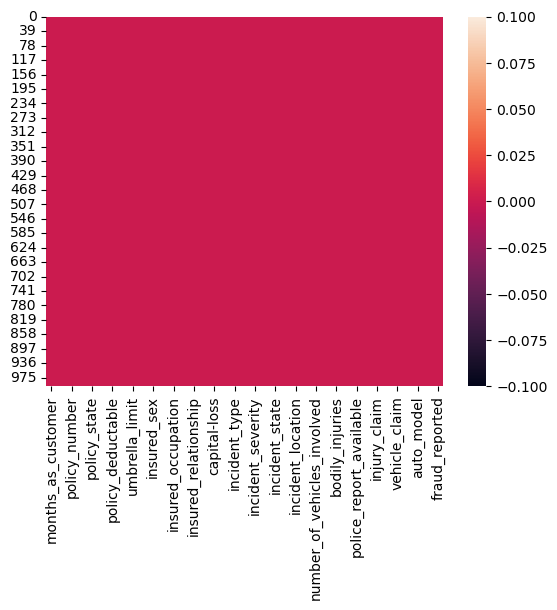

In [37]:
sns.heatmap(df.isnull())

In the dataset, there are no null values present.

In [41]:
#Converting to date time format-
df['policy_bind_date']=pd.to_datetime(df.policy_bind_date,format='%d-%m-%Y')

In [44]:
df.describe()

,months_as_customer,age,policy_number,policy_bind_date,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
count,999.000000,999.000000,999.000000,999,999.000000,999.000000,9.990000e+02,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000
mean,203.829830,38.938939,546263.326326,2002-02-03 13:21:26.486486400,1136.136136,1256.255495,1.102102e+06,501249.605606,25097.897898,-26820.520521,11.650651,1.839840,0.991992,1.486486,52743.073073,7434.344344,7393.943944,37914.784785,2005.104104
min,0.000000,19.000000,100804.000000,1990-01-08 00:00:00,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-111100.000000,0.000000,1.000000,0.000000,0.000000,100.000000,0.000000,0.000000,70.000000,1995.000000
25%,115.500000,32.000000,335913.500000,1995-09-19 00:00:00,500.000000,1089.185000,0.000000e+00,448373.000000,0.000000,-51500.000000,6.000000,1.000000,0.000000,1.000000,41775.000000,4290.000000,4440.000000,30275.000000,2000.000000
50%,199.000000,38.000000,533940.000000,2002-04-01 00:00:00,1000.000000,1257.040000,0.000000e+00,466498.000000,0.000000,-24100.000000,12.000000,1.000000,1.000000,1.000000,57970.000000,6780.000000,6750.000000,42080.000000,2005.000000
75%,276.000000,44.000000,759459.500000,2008-04-05 12:00:00,2000.000000,1415.710000,0.000000e+00,603254.000000,51000.000000,0.000000,17.000000,3.000000,2.000000,2.000000,70550.000000,11310.000000,10870.000000,50775.000000,2010.000000
max,479.000000,64.000000,999435.000000,2015-02-22 00:00:00,2000.000000,2047.590000,1.000000e+07,620962.000000,100500.000000,0.000000,23.000000,4.000000,2.000000,3.000000,114920.000000,21450.000000,23670.000000,79560.000000,2015.000000
std,115.103809,9.140370,257190.576942,NaN,612.155989,244.243187,2.298293e+06,71728.919924,27871.869471,28105.366259,6.951671,1.019044,0.820538,1.111773,26408.011569,4883.309038,4823.859773,18890.397013,6.018773


# observations:

1. **No Null Values**: The count of all columns is the same, indicating there are no null values in the dataset.

2. **Skewness**:
   - Right Skewed Data: Columns like months_as_customer, policy_number, policy_deductable, umbrella_limit, insured_zip, capital-gains, number_of_vehicles_involved, witnesses, injury_claim, and property_claim may exhibit right-skewed distributions, as their means are greater than their medians.
   - Left Skewed Data: Columns like policy_annual_premium, capital-loss, incident_hour_of_the_day, bodily_injuries, total_claim_amount, and vehicle_claim may exhibit left-skewed distributions, as their medians are greater than their means.

3. **Outliers**:
   - Outliers Potential: There is a significant difference between the 75th percentile and the maximum values in columns like months_as_customer, age, policy_annual_premium, capital-gains, total_claim_amount, injury_claim, property_claim, and vehicle_claim, indicating the presence of outliers in these columns.

# 3. Data Visualization

# 1.Univariate Analysis-

In [45]:
df.shape

(999, 39)

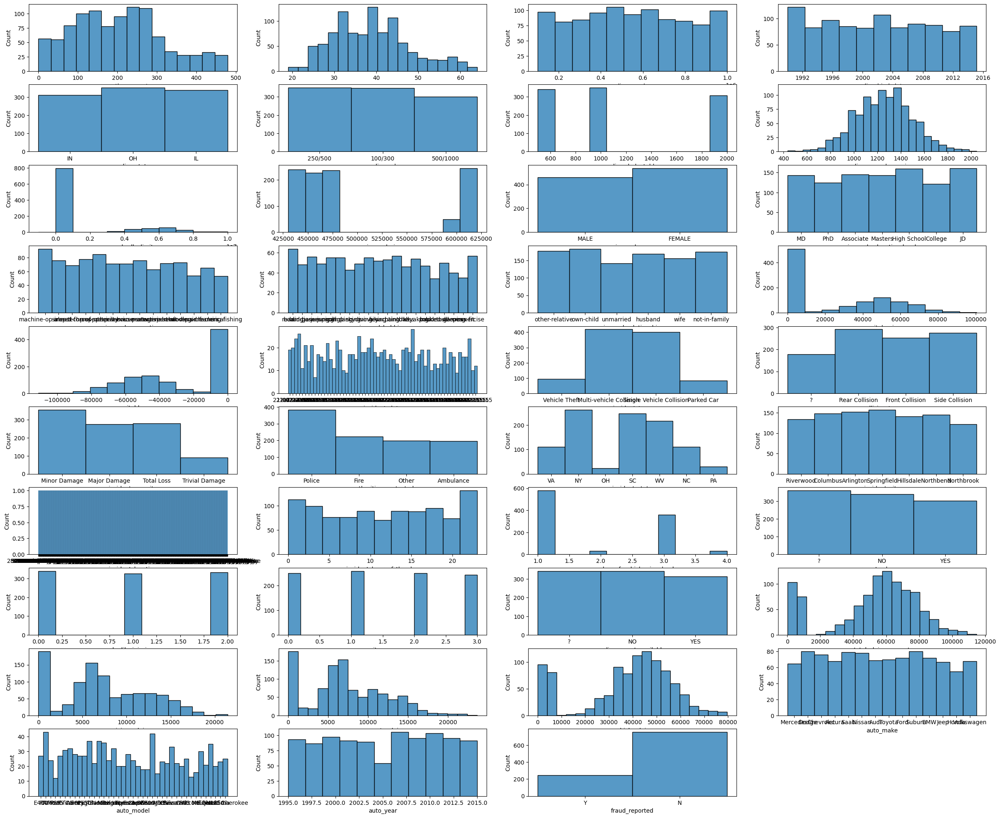

In [46]:
plt.figure(figsize=(30,25))
plotnumber=1

for i in df.columns:
    if plotnumber<=40:
        ax=plt.subplot(10,4,plotnumber)
        sns.histplot(df[i])
        plt.xlabel(i)
    plotnumber+=1
plt.show() 

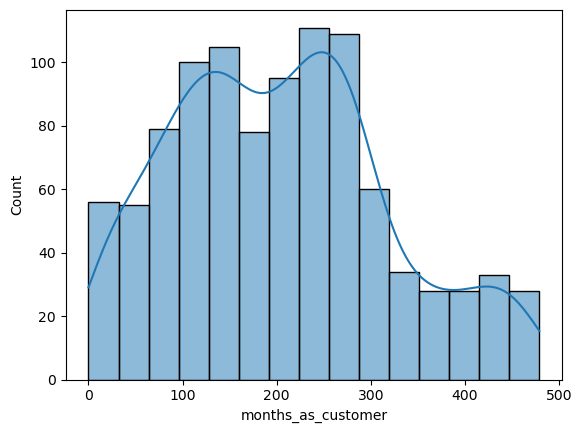

In [48]:
sns.histplot(x=df['months_as_customer'],kde=True)
plt.show()

The `months_as_customer` column contains values ranging from 0 to 480 months.

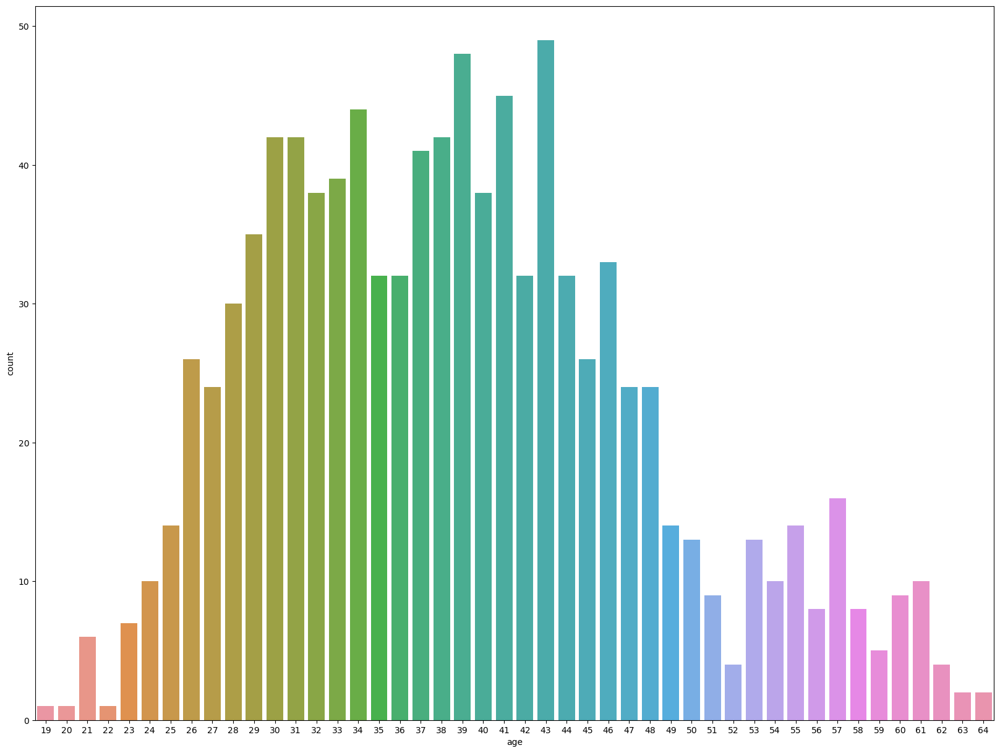

In [53]:
plt.figure(figsize=(20,15))
sns.countplot(x=df['age'])
plt.show()

Here, we can observe that most customers are between the ages of 26 and 46 years.

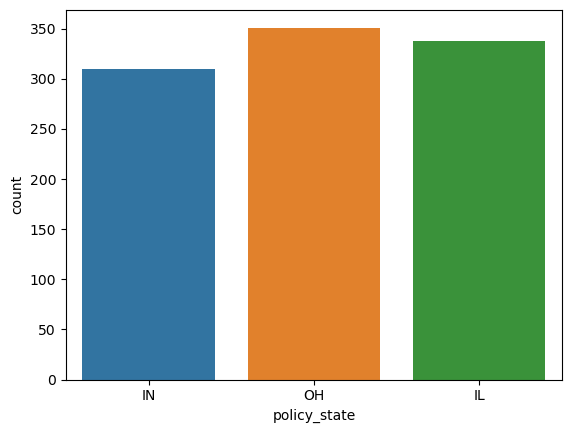

In [55]:
sns.countplot(x=df['policy_state'])
plt.show()

Customers with a policy state of OH are greater in number.

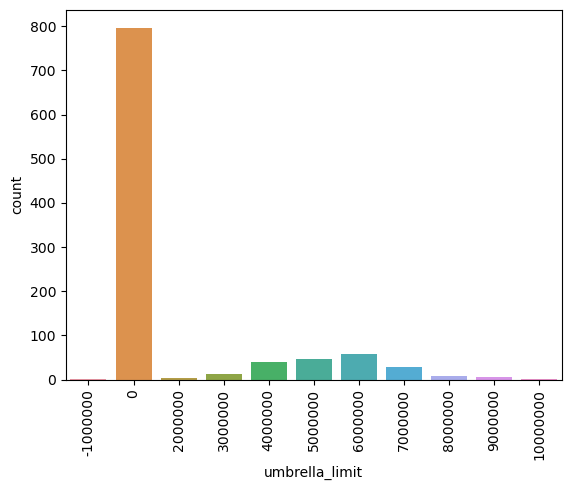

In [57]:
sns.countplot(x=df['umbrella_limit'])
plt.xticks(rotation=90)
plt.show()

Customers with an umbrella limit of 0 are the most numerous.

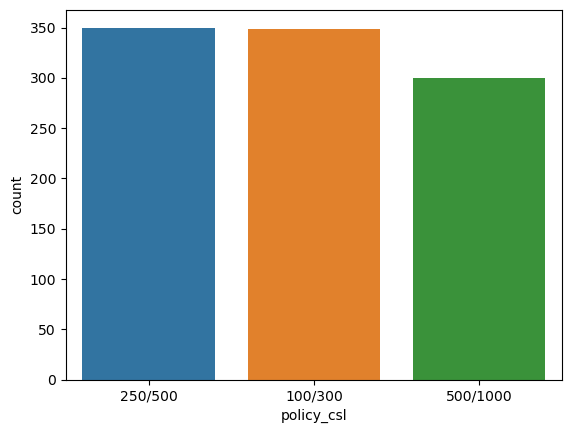

In [58]:
sns.countplot(x=df['policy_csl'])
plt.show()

Customers with a 500/1000 policy CSL are fewer in number.

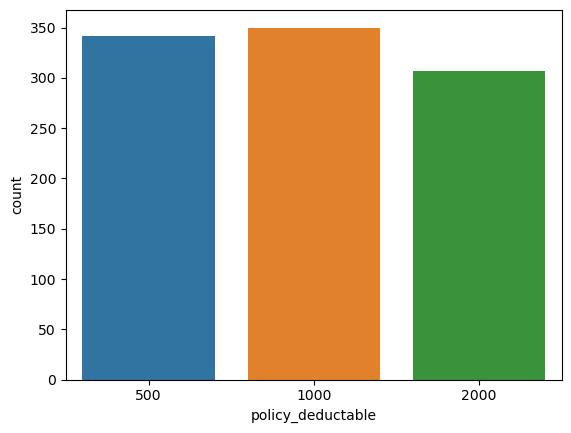

In [59]:
sns.countplot(x=df['policy_deductable'])
plt.show()

Customers with a policy deductible of 1000 Rs are more numerous.

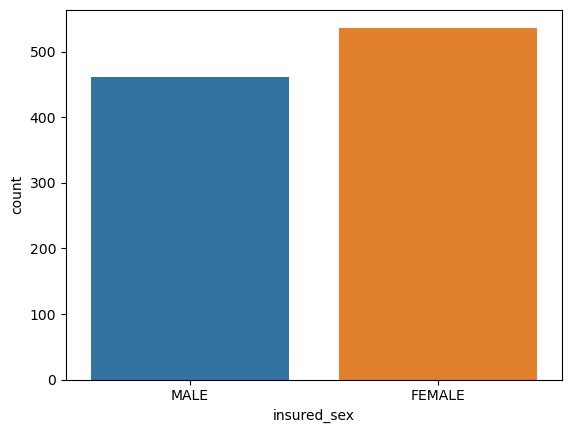

In [60]:
sns.countplot(x=df['insured_sex'])
plt.show()

The number of female customers is higher than that of male customers.

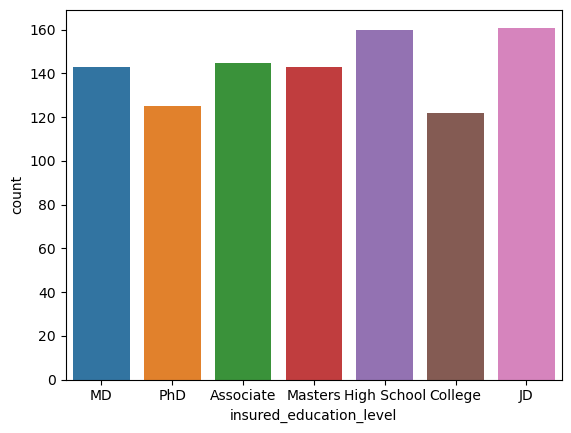

In [61]:
sns.countplot(x=df['insured_education_level'])
plt.show()

Customers with High School and JD as their education levels are more numerous.

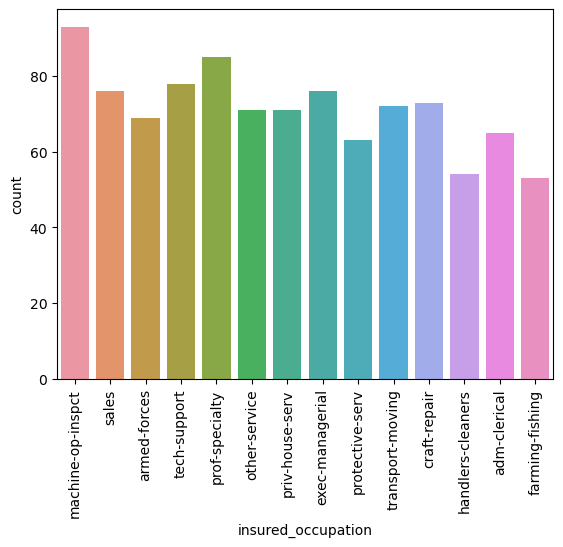

In [62]:
sns.countplot(x=df['insured_occupation'])
plt.xticks(rotation=90)
plt.show()

Customers with the occupation of machine-op-inspct are more numerous.

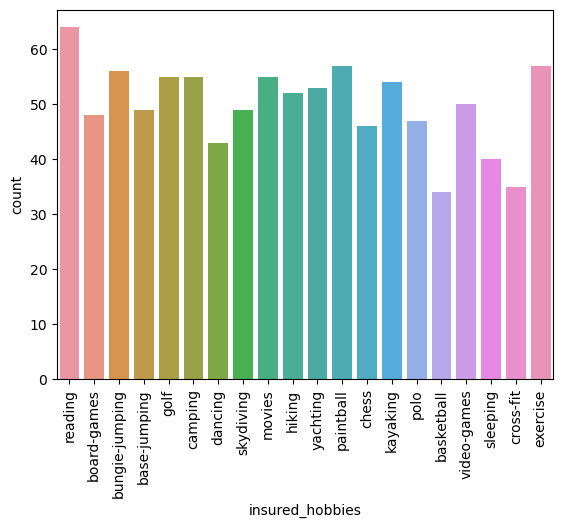

In [63]:
sns.countplot(x=df['insured_hobbies'])
plt.xticks(rotation=90)
plt.show()

Customers with reading as their hobby are more numerous.

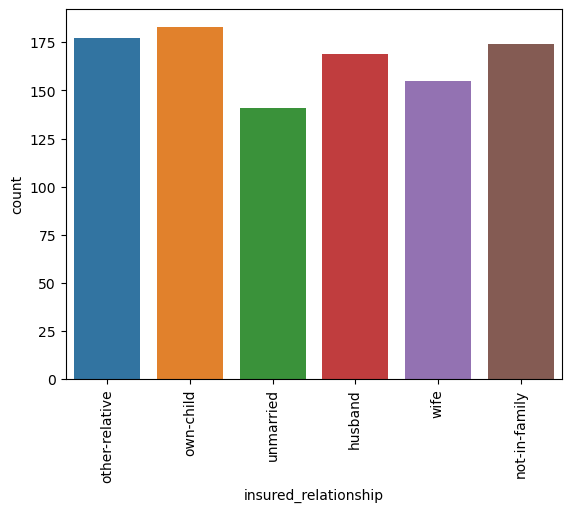

In [64]:
sns.countplot(x=df['insured_relationship'])
plt.xticks(rotation=90)
plt.show()

Customers with the relationship status of "own-child" are more numerous.

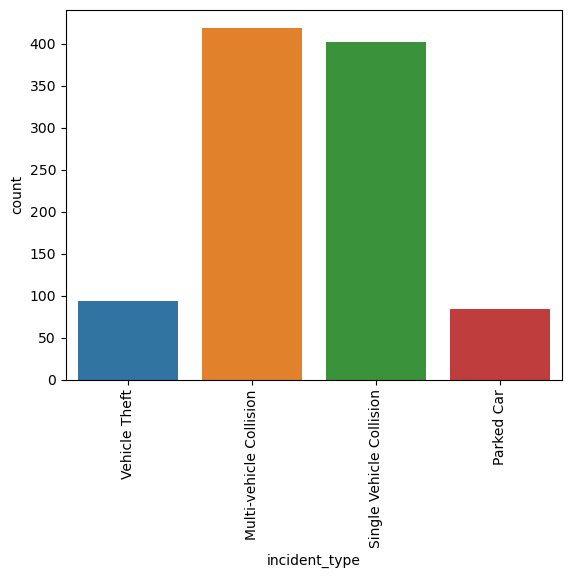

In [65]:
sns.countplot(x=df['incident_type'])
plt.xticks(rotation=90)
plt.show()


Multi-vehicle and single-vehicle collision types of claims are higher in number than other types.

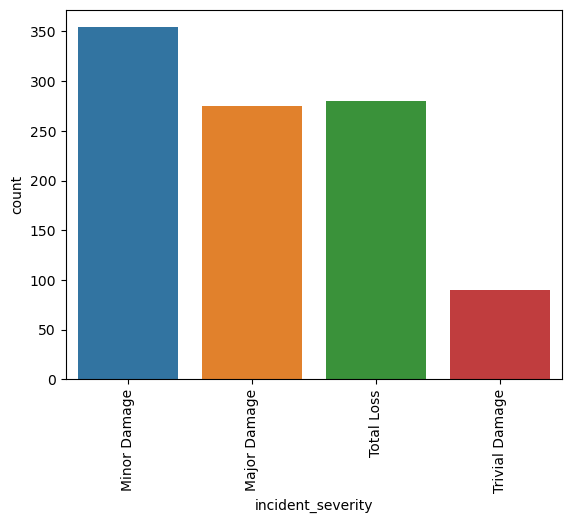

In [66]:
sns.countplot(x=df['incident_severity'])
plt.xticks(rotation=90)
plt.show()

Customers with minor damage severity level are higher in number.

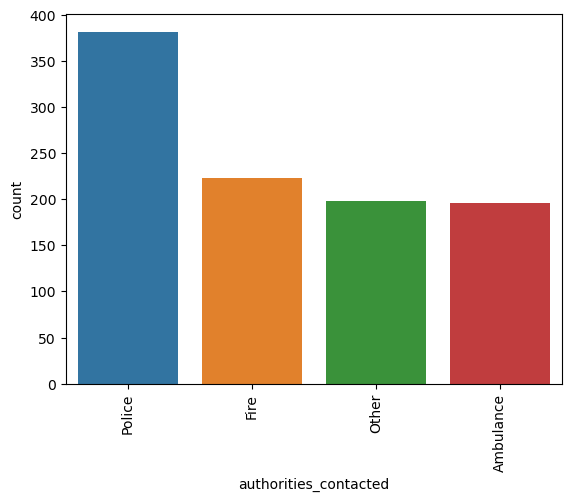

In [67]:
sns.countplot(x=df['authorities_contacted'])
plt.xticks(rotation=90)
plt.show()

Customers who contacted police authorities after the damage are numerous.

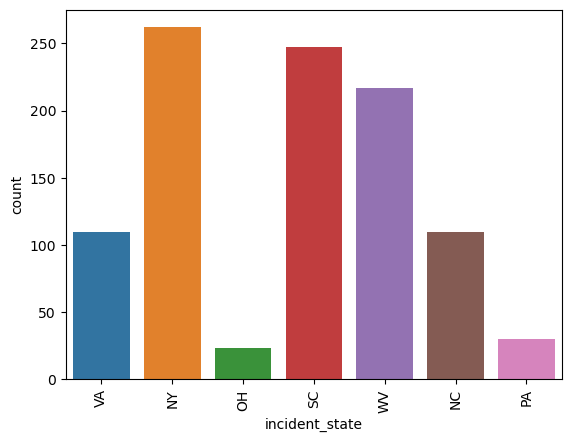

In [68]:
sns.countplot(x=df['incident_state'])
plt.xticks(rotation=90)
plt.show()

Customers with incidents that happened in NY state are numerous, while those in OH state are the lowest in number.

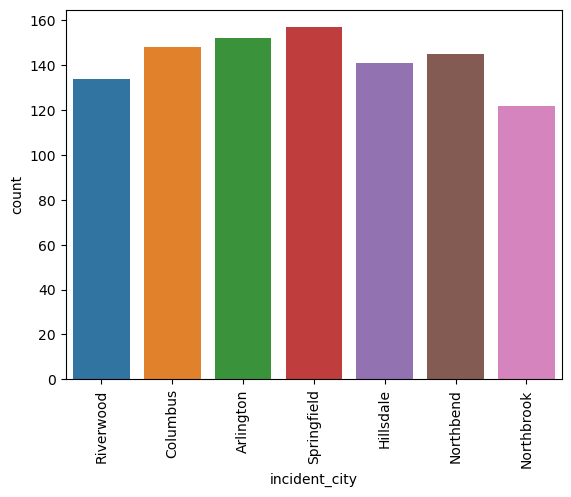

In [69]:
sns.countplot(x=df['incident_city'])
plt.xticks(rotation=90)
plt.show()

Customers with incidents that happened in Springfield city are the highest in number.

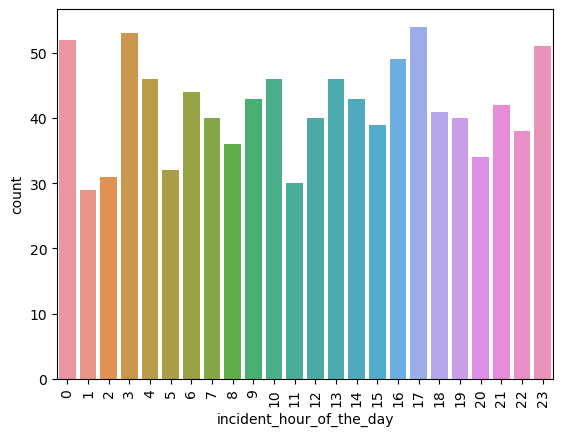

In [70]:
sns.countplot(x=df['incident_hour_of_the_day'])
plt.xticks(rotation=90)
plt.show()

There doesn't seem to be a discernible pattern in the count of incidents by hour of the day.

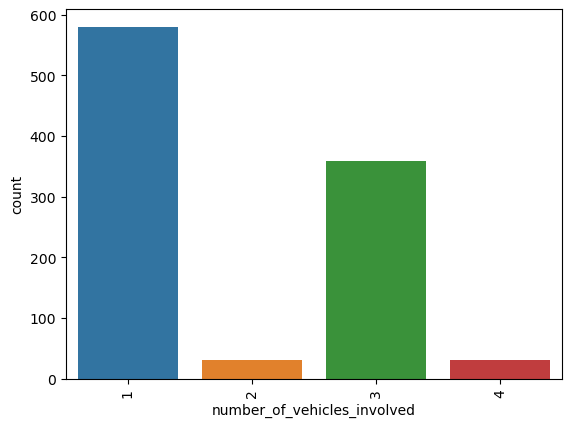

In [71]:
sns.countplot(x=df['number_of_vehicles_involved'])
plt.xticks(rotation=90)
plt.show()

Customers involved in accidents with only one vehicle are more numerous.

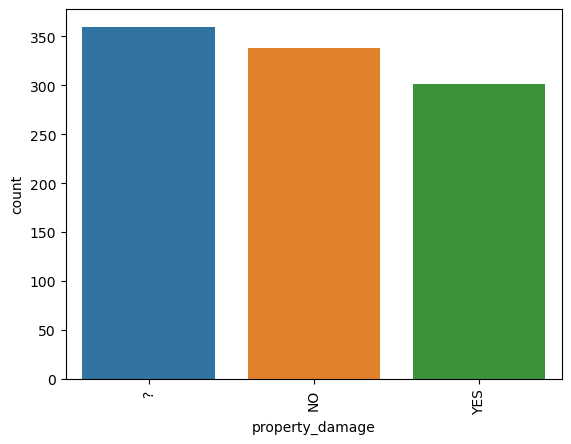

In [72]:
sns.countplot(x=df['property_damage'])
plt.xticks(rotation=90)
plt.show()

Customers with ambiguity regarding whether property was damaged or not are numerous.

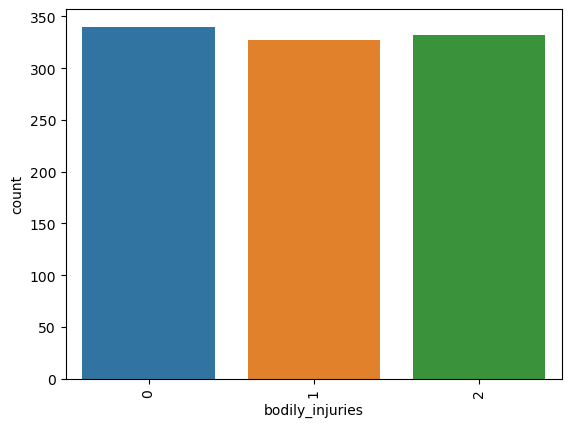

In [73]:
sns.countplot(x=df['bodily_injuries'])
plt.xticks(rotation=90)
plt.show()

Customers with zero bodily injuries are numerous.

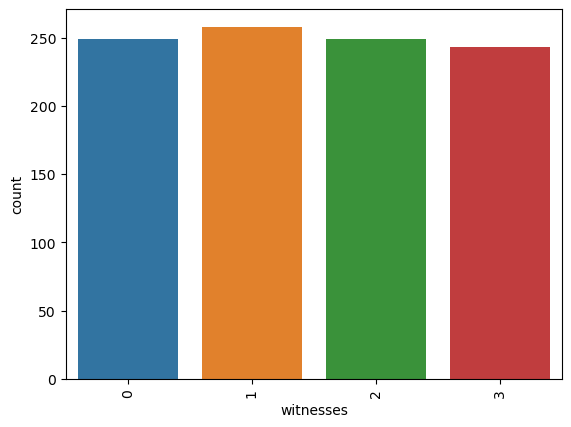

In [74]:
sns.countplot(x=df['witnesses'])
plt.xticks(rotation=90)
plt.show()

Customers with one witness involved are numerous.

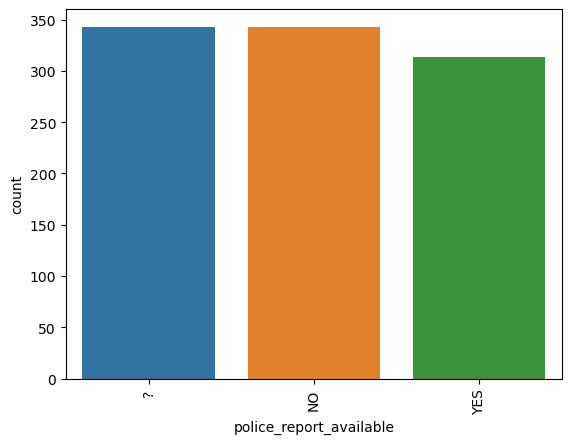

In [75]:
sns.countplot(x=df['police_report_available'])
plt.xticks(rotation=90)
plt.show()

Customers with a police report available are fewer in number.

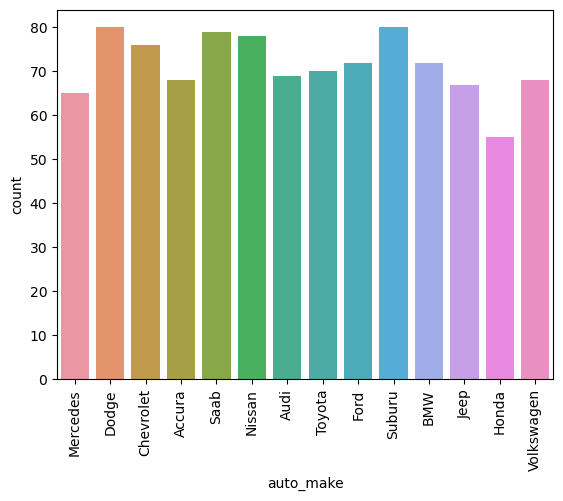

In [76]:
sns.countplot(x=df['auto_make'])
plt.xticks(rotation=90)
plt.show()

Customers with Honda make of their vehicles are fewer in number.

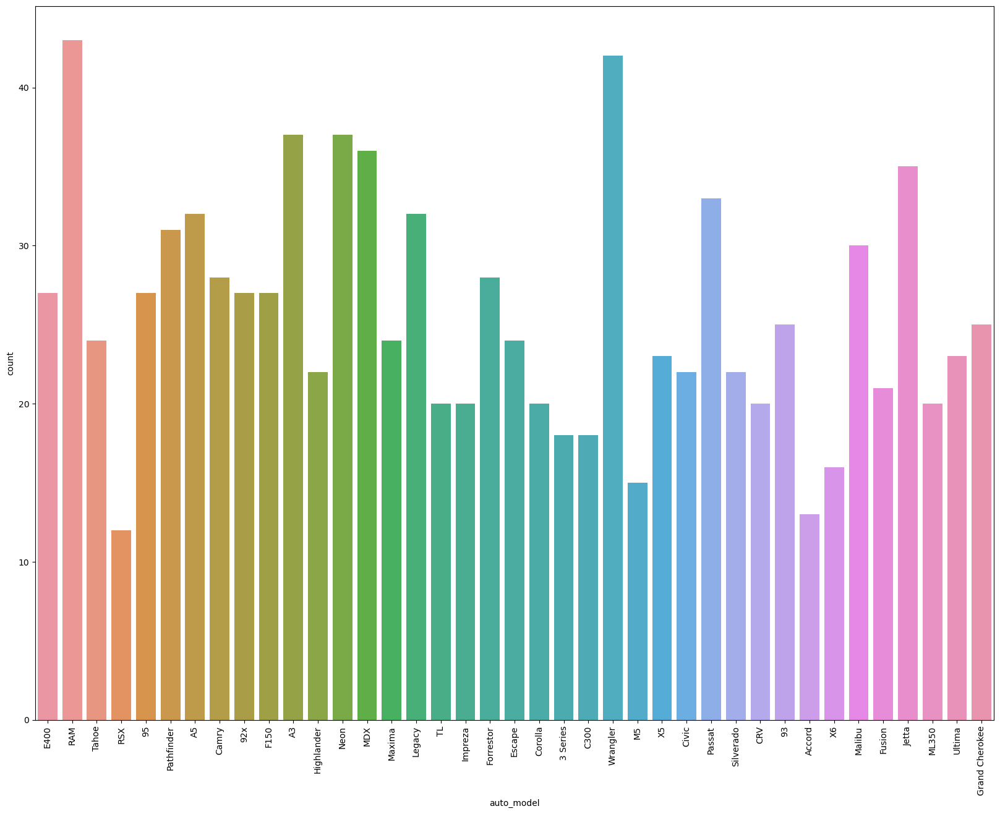

In [77]:
plt.figure(figsize=(20,15))
sns.countplot(x=df['auto_model'])
plt.xticks(rotation=90)
plt.show()

Customers with RAM auto model are the highest in number, while customers with RSX auto model are the least in number.

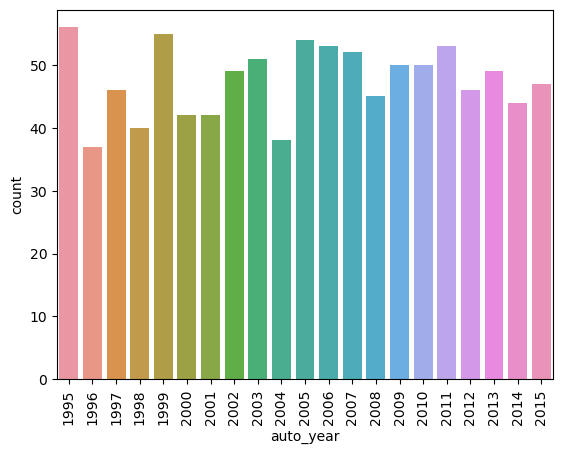

In [78]:
sns.countplot(x=df['auto_year'])
plt.xticks(rotation=90)
plt.show()

Customers with vehicles from the year 1996 are the least in number, while customers with vehicles from the year 1995 are the highest in number.

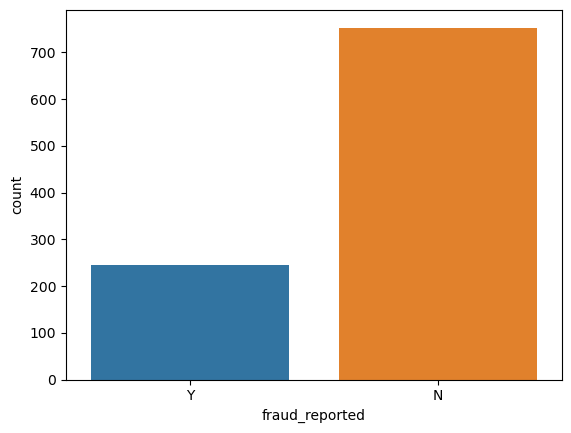

In [79]:
sns.countplot(x=df['fraud_reported'])
plt.show()

Customers reporting fraud are fewer in number. As this is a binary classification problem, it's evident that there is a class imbalance that needs to be addressed as we proceed with model building.

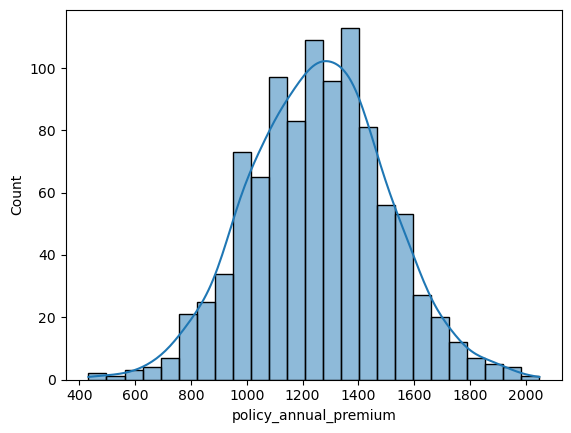

In [80]:
sns.histplot(x=df['policy_annual_premium'],kde=True)
plt.show()

The policy annual premium for customers falls within the range of 400 to 2000.

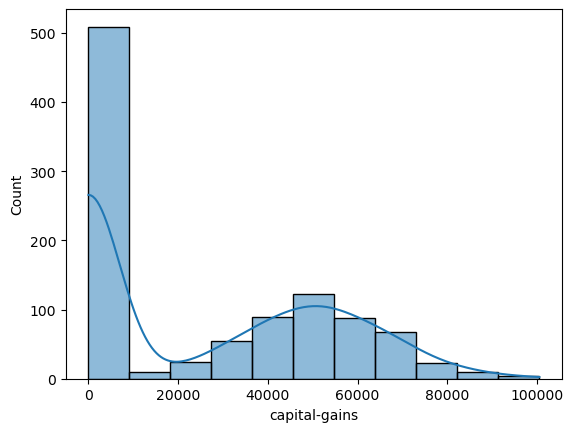

In [81]:
sns.histplot(x=df['capital-gains'],kde=True)
plt.show()

The profit accrued due to insurance premium falls within the range of 0 to 100,000.

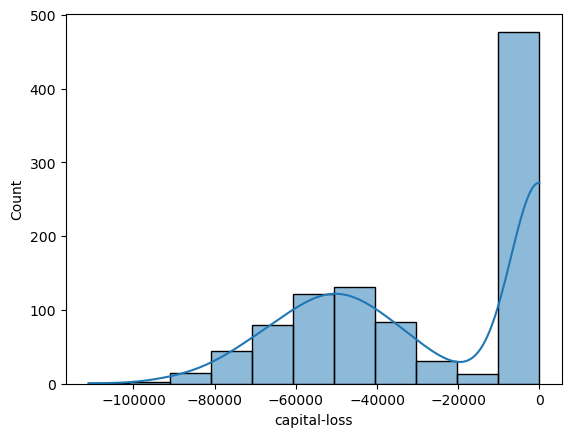

In [82]:
sns.histplot(x=df['capital-loss'],kde=True)
plt.show()


The losses incurred by customers due to insurance claims fall within the range of -100,000 to 0.

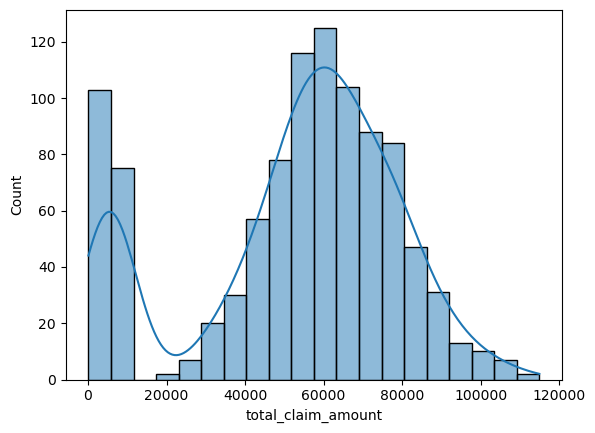

In [83]:
sns.histplot(x=df['total_claim_amount'],kde=True)
plt.show()

The total claim amount falls within the range of 0 to 120,000.

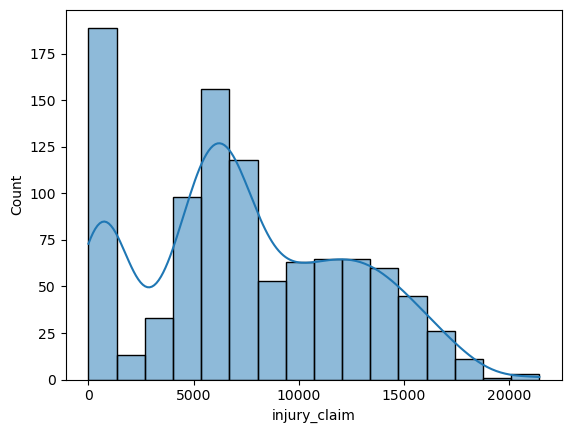

In [84]:
sns.histplot(x=df['injury_claim'],kde=True)
plt.show()

The injury claim amount falls within the range of 0 to 20,000.

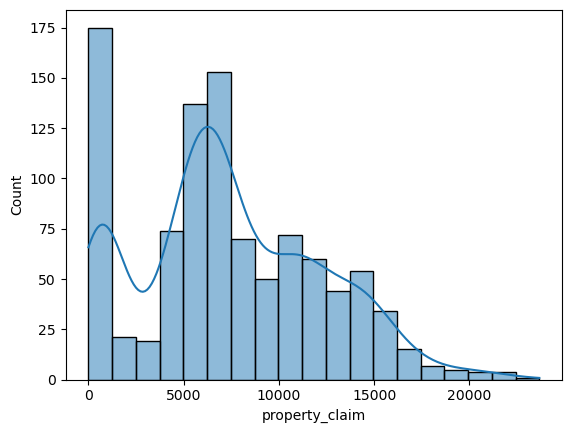

In [85]:
sns.histplot(x=df['property_claim'],kde=True)
plt.show()

The property claim amount falls within the range of 0 to 25,000.

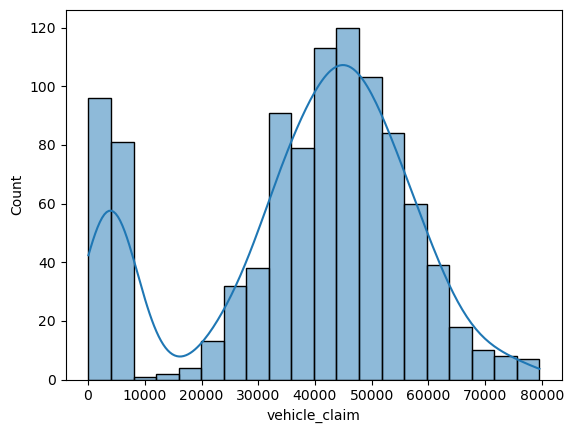

In [86]:
sns.histplot(x=df['vehicle_claim'],kde=True)
plt.show()

The vehicle claim amount falls within the range of 0 to 80,000.

# 2.Bivariate analysis-

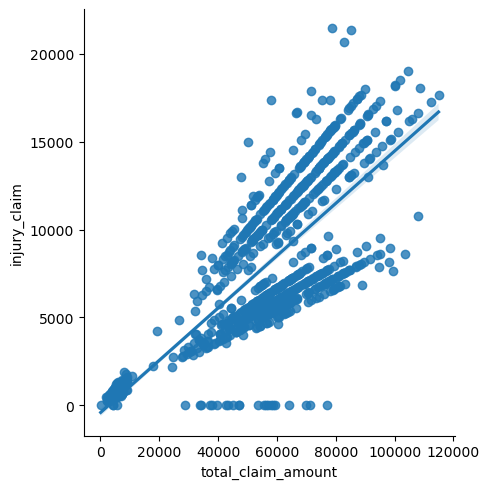

In [87]:
sns.lmplot(x='total_claim_amount',y='injury_claim',data=df)
plt.show()

A strong positive correlation can be observed between injury claim and total claim amount.

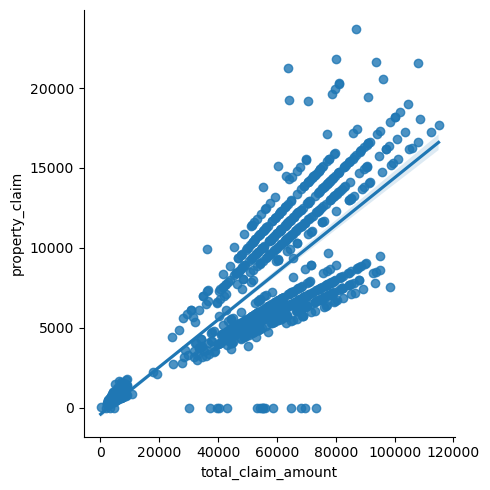

In [88]:
sns.lmplot(x='total_claim_amount',y='property_claim',data=df)
plt.show()

A strong positive correlation is evident between injury claim and total claim amount.

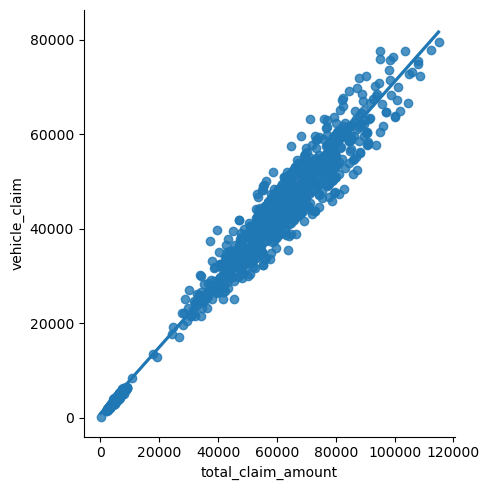

In [89]:
sns.lmplot(x='total_claim_amount',y='vehicle_claim',data=df)
plt.show()

A strong positive correlation is observed between vehicle claim and total claim amount.

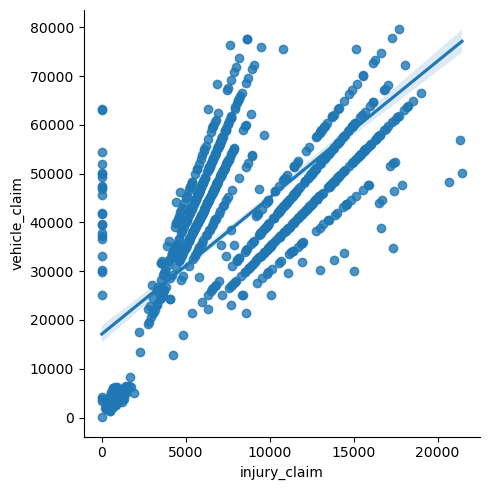

In [90]:
sns.lmplot(x='injury_claim',y='vehicle_claim',data=df)
plt.show()

A positive relationship is evident between injury claim and vehicle claim.

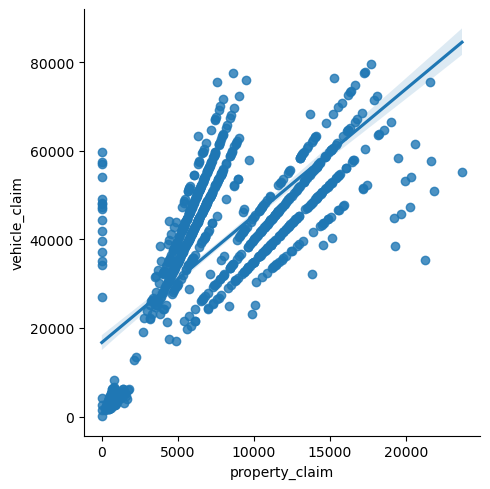

In [91]:
sns.lmplot(x='property_claim',y='vehicle_claim',data=df)
plt.show()

A positive relationship is observed between property claim and vehicle claim.

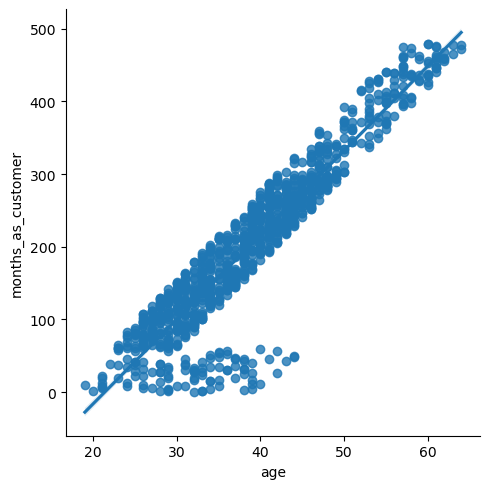

In [92]:
sns.lmplot(x='age',y='months_as_customer',data=df)
plt.show()

A strong positive correlation is evident between age and months as a customer.

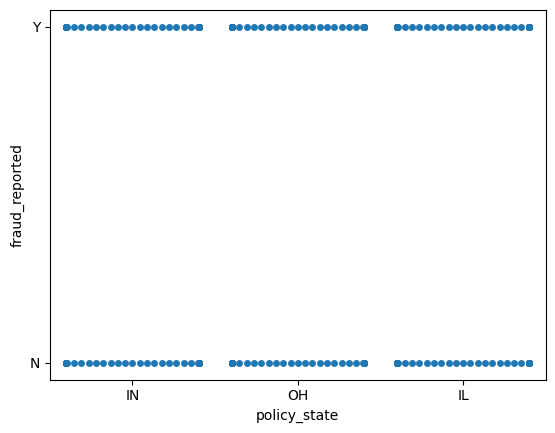

In [94]:
sns.swarmplot(x='policy_state',y='fraud_reported',data=df)
plt.show()

There doesn't seem to be a discernible pattern between policy state and fraud reported.

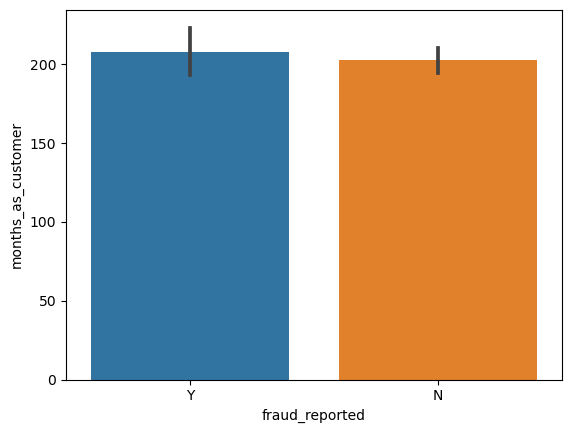

In [96]:
sns.barplot(x='fraud_reported',y='months_as_customer',data=df)
plt.show()

There's a higher likelihood of customers who have been with us for a longer duration making fraudulent claims.

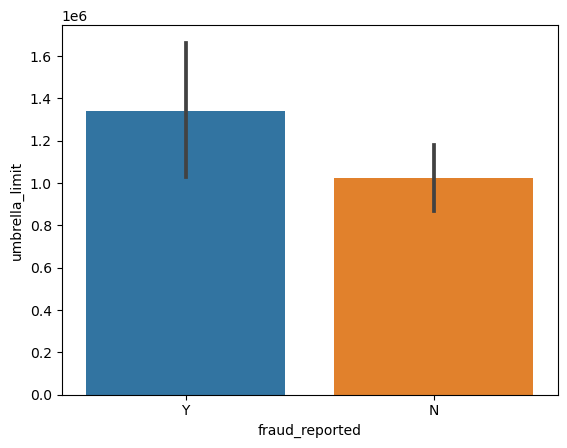

In [97]:
sns.barplot(x='fraud_reported',y='umbrella_limit',data=df)
plt.show()

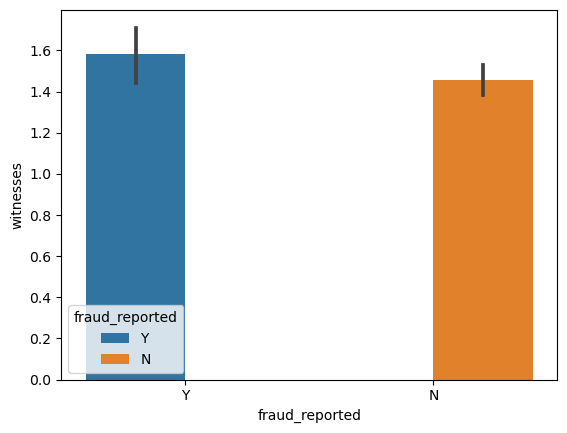

In [98]:
sns.barplot(x='fraud_reported',y='witnesses',data=df,hue='fraud_reported')
plt.show()

Customers with a greater number of witnesses are more likely to make fraudulent claims.

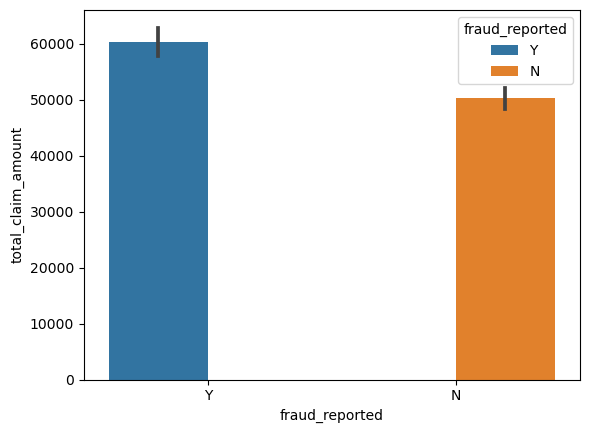

In [99]:
sns.barplot(x='fraud_reported',y='total_claim_amount',data=df,hue='fraud_reported')
plt.show()

Customers with higher total claim amounts are more likely to make fraudulent claims.

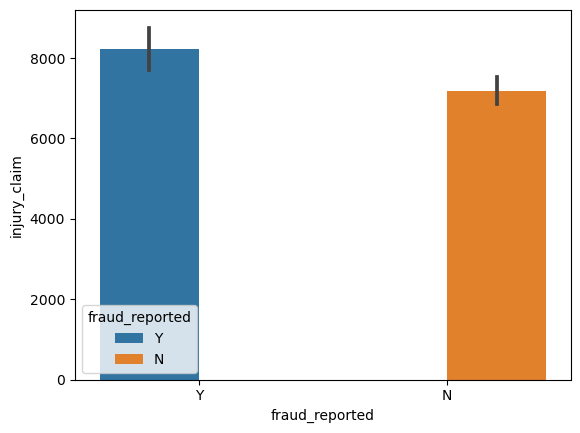

In [100]:
sns.barplot(x='fraud_reported',y='injury_claim',data=df,hue='fraud_reported')
plt.show()

Customers with high injury claim amounts are more likely to make fraudulent claims.

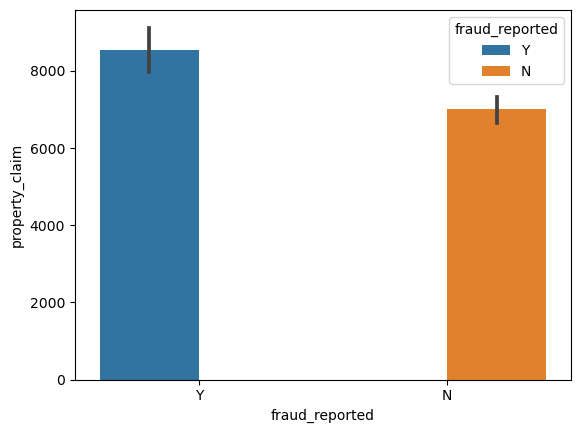

In [101]:
sns.barplot(x='fraud_reported',y='property_claim',data=df,hue='fraud_reported')
plt.show()

Customers with high property claim amounts are more likely to make fraudulent claims.

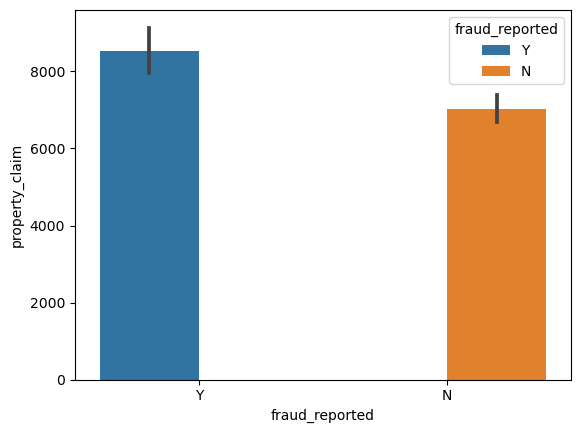

In [102]:
sns.barplot(x='fraud_reported',y='property_claim',data=df,hue='fraud_reported')
plt.show()

Customers with high property claim amounts are more likely to make fraudulent claims.

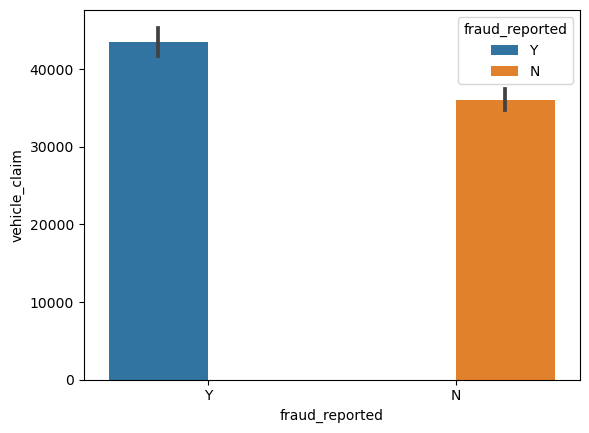

In [103]:
sns.barplot(x='fraud_reported',y='vehicle_claim',data=df,hue='fraud_reported')
plt.show()

Customers with high vehicle claim amounts are more likely to make fraudulent claims.

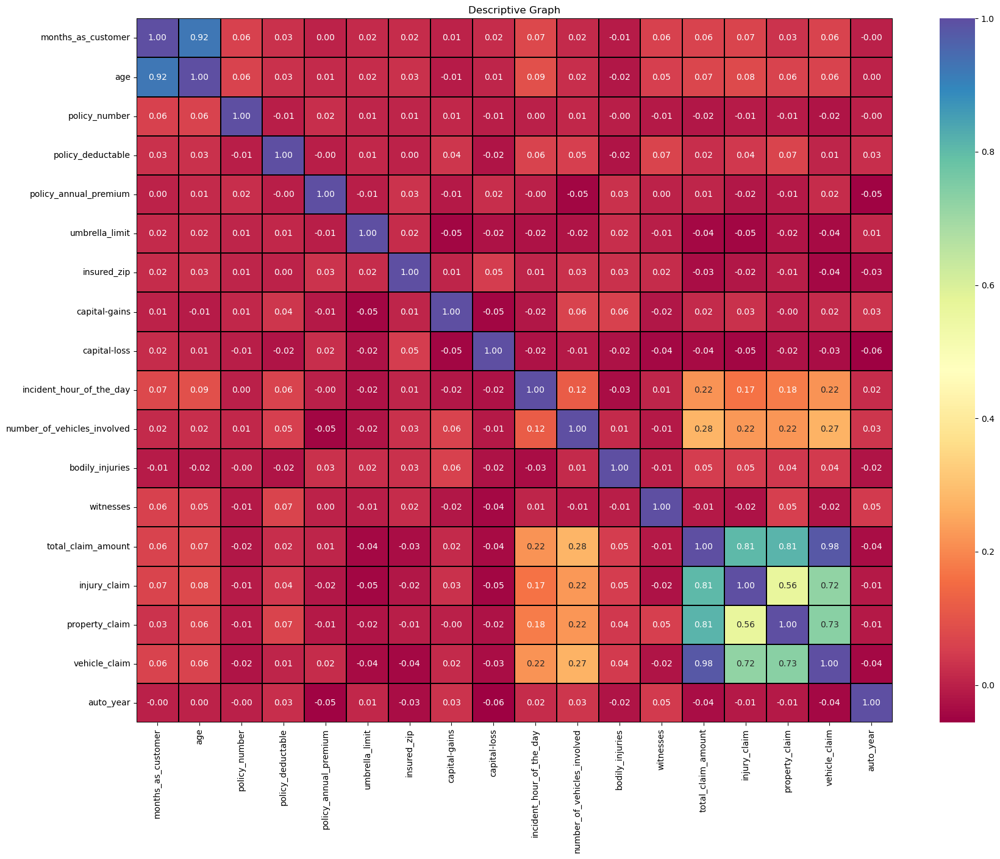

In [105]:
numeric_df = df.select_dtypes(include=['float64', 'int64'])
plt.figure(figsize=(20, 15))
sns.heatmap(numeric_df.corr(), annot=True, fmt='0.2f', linewidth=0.2, linecolor='Black', cmap='Spectral')
plt.title('Descriptive Graph')
plt.show()


# observations:

1. There is a 92% positive correlation between age and months as a customer.
2. There is an 81% positive correlation between total claim amount and injury claim.
3. There is a 98% positive correlation between total claim amount and vehicle claim.
4. There is a 73% positive correlation between total property claim and vehicle claim.
5. There is a 72% positive correlation between total injury claim and vehicle claim.



# 3.Multivariate analysis-

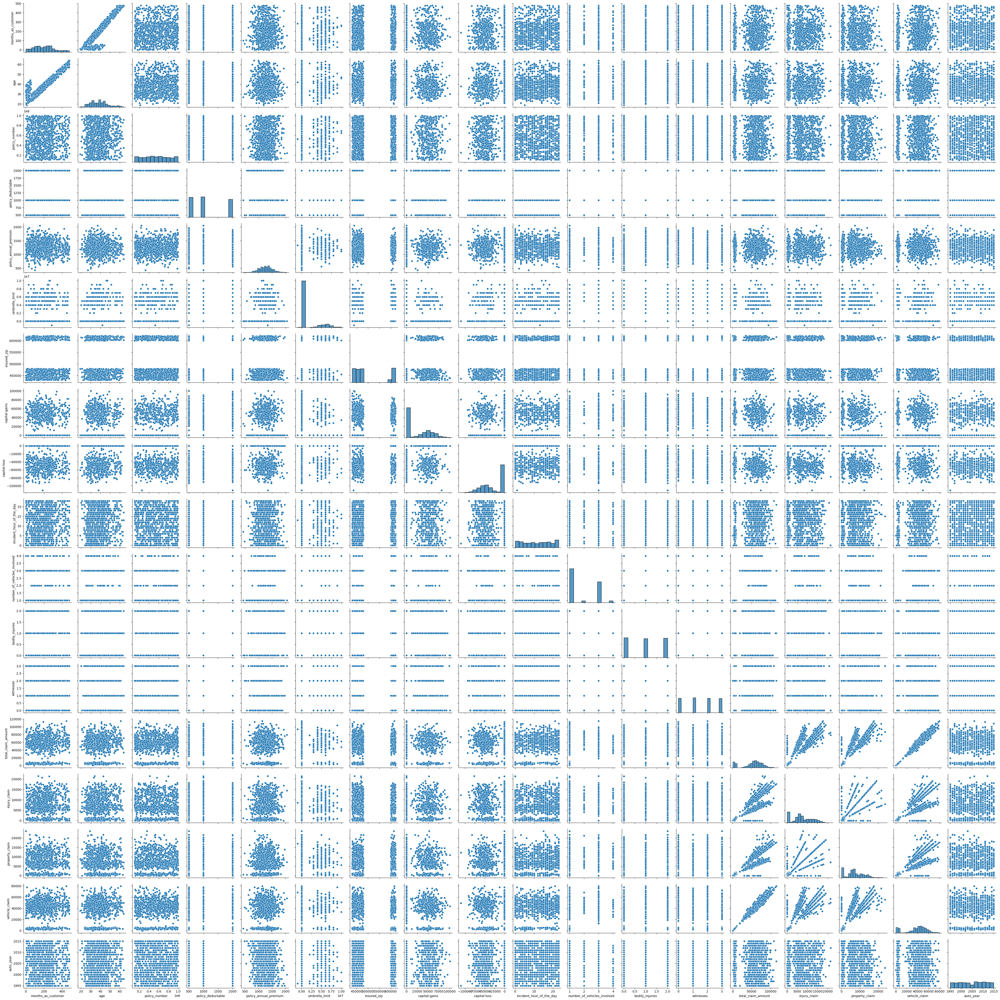

In [104]:
sns.pairplot(df)

# observations:

1. There is a high positive correlation between age and months as a customer.
2. Customers with high vehicle claim amounts are more likely to make fraudulent claims.
3. Customers with high property claim amounts are more likely to make fraudulent claims.
4. Customers with high injury claim amounts are more likely to make fraudulent claims.
5. Customers with high total claim amounts are more likely to make fraudulent claims.
6. There is a good positive correlation between injury claim and total claim amount.
7. A positive relationship exists between injury claim and vehicle claim.
8. There is a high positive correlation between vehicle claim and total claim amount.
9. A positive relationship exists between property claim and vehicle claim.


In [122]:
df=df.drop(columns=['policy_number','policy_bind_date',],axis=1)

In [123]:
num_col= df.select_dtypes(include=['float64', 'int64'])
num_col.columns

Index(['months_as_customer', 'age', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip',
       'capital-gains', 'capital-loss', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'bodily_injuries', 'witnesses',
       'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim',
       'auto_year'],
      dtype='object')

In [124]:
cat_col= df.select_dtypes(include=['object'])
cat_col.columns

Index(['policy_state', 'policy_csl', 'insured_sex', 'insured_education_level',
       'insured_occupation', 'insured_hobbies', 'insured_relationship',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'property_damage', 'police_report_available',
       'auto_make', 'auto_model', 'fraud_reported'],
      dtype='object')

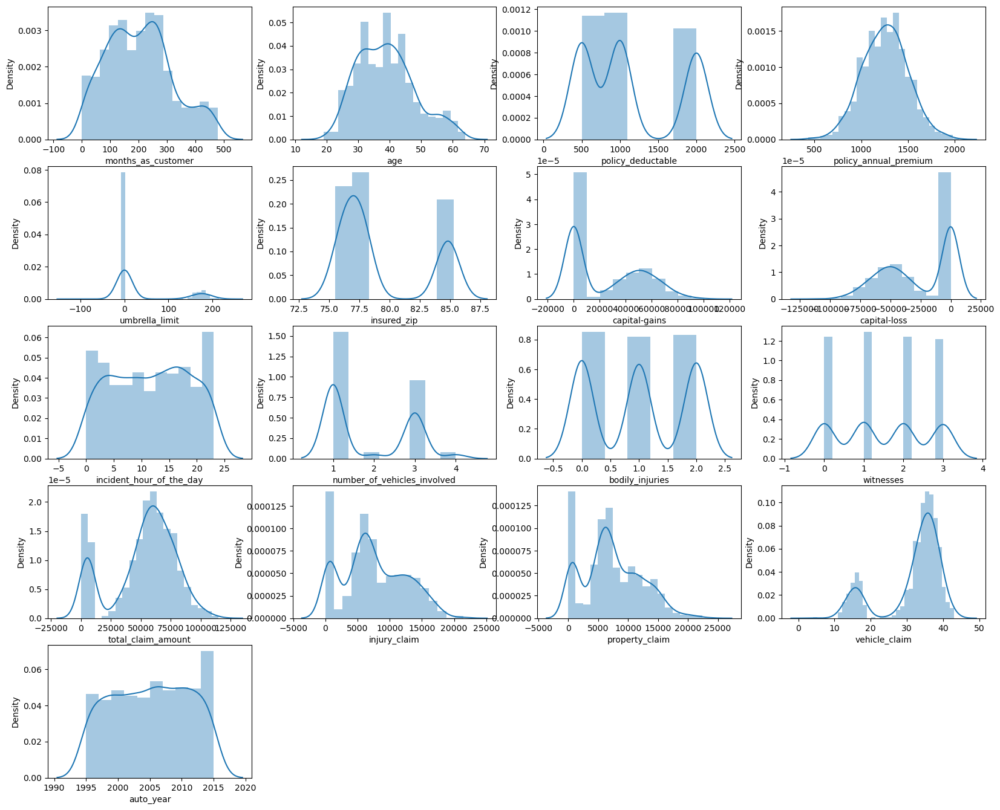

In [125]:
plt.figure(figsize=(20,20))
plotnumber=1


for column in num_col:
    if plotnumber<=24:
        ax=plt.subplot(6,4,plotnumber)
        sns.distplot(df[column])
        plt.xlabel(column)
    plotnumber+=1   
plt.show() 

In [ ]:
num_col.skew()

In the columns such as umbrella_limit, insured_zip, total_claim_amount, and vehicle_claim, the skewness is higher than the acceptable range, which typically falls between -0.5 and 0.5.

# Using the cube root method, we aim to eliminate skewness from the dataset.

In [127]:
df['umbrella_limit'] = np.cbrt(df['umbrella_limit'])
df['insured_zip'] = np.cbrt(df['insured_zip'])
df['vehicle_claim'] = np.cbrt(df['vehicle_claim'])


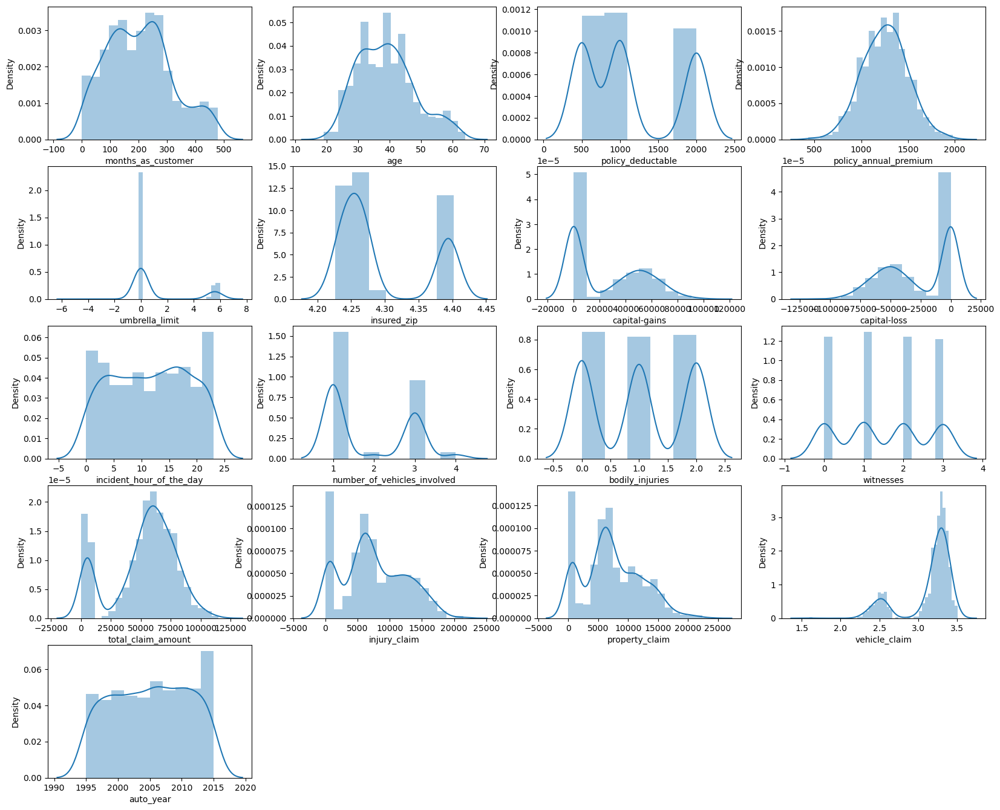

In [129]:
plt.figure(figsize=(20,20))
plotnumber=1


for column in num_col:
    if plotnumber<=24:
        ax=plt.subplot(6,4,plotnumber)
        sns.distplot(df[column])
        plt.xlabel(column)
    plotnumber+=1   
plt.show() 

# Outliers-

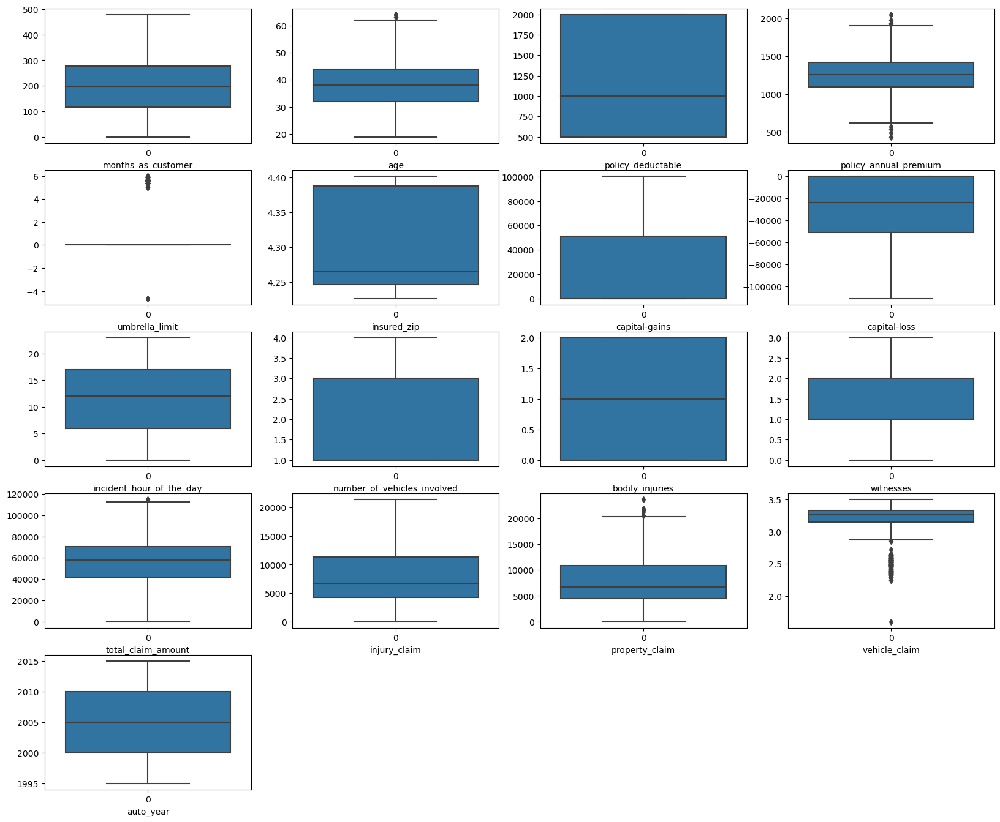

In [131]:
plt.figure(figsize=(20,20))
plotnumber=1


for column in num_col:
    if plotnumber<=24:
        ax=plt.subplot(6,4,plotnumber)
        sns.boxplot(df[column])
        plt.xlabel(column)
    plotnumber+=1   
plt.show()  

From the plot above, it's evident that outliers exist in columns such as age, policy_annual_premium, umbrella_unit, property_claim, and vehicle_claim.

# Removing outliers using the Z score method:

In [133]:
from scipy.stats import zscore
features=df[['age','policy_annual_premium','umbrella_limit','property_claim','vehicle_claim']]

In [134]:
z=np.abs(zscore(features))
z.shape

(999, 5)

In [135]:
threshold=3
print(np.where(z>3))

(array([228, 247, 499, 762, 774], dtype=int64), array([1, 1, 3, 1, 4], dtype=int64))


In [136]:
df.shape

(999, 37)

In [137]:
df=df[(z<3).all(axis=1)]

In [139]:
df.shape

(994, 37)

# Data loss

In [140]:
(999-994)/999*100

0.5005005005005005

We've successfully removed the outliers from the dataset, and the data loss is minimal, only 0.51%.

# Encoding of the object data-

In [143]:
cat_col.columns

Index(['policy_state', 'policy_csl', 'insured_sex', 'insured_education_level',
       'insured_occupation', 'insured_hobbies', 'insured_relationship',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'property_damage', 'police_report_available',
       'auto_make', 'auto_model', 'fraud_reported'],
      dtype='object')

In [144]:
from sklearn.preprocessing import LabelEncoder
columns_LabelEncoder = ['fraud_reported', 'policy_state', 'policy_csl', 'insured_sex',
                     'incident_type', 'collision_type', 'incident_severity',
                     'property_damage', 'police_report_available']
le = LabelEncoder()
for col in columns_LabelEncoder:
    df[col] = le.fit_transform(df[col])


In [146]:
df

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,228,42,1,1,2000,1197.22,5.550473,4.266242,1,MD,...,0,0,5070,780,780,2.476983,Mercedes,E400,2007,1
1,134,29,2,0,2000,1413.14,5.550473,4.226801,0,PhD,...,3,1,34650,7700,3850,3.053836,Dodge,RAM,2007,0
2,256,41,0,1,2000,1415.74,5.664061,4.392029,0,PhD,...,2,1,63400,6340,6340,3.332711,Chevrolet,Tahoe,2014,1
3,228,44,0,2,1000,1583.91,5.664061,4.394103,1,Associate,...,1,1,6500,1300,650,2.549445,Accura,RSX,2009,0
4,256,39,2,1,1000,1351.10,0.000000,4.276550,0,PhD,...,2,1,64100,6410,6410,3.336780,Saab,95,2003,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
994,3,38,2,2,1000,1310.80,0.000000,4.227517,0,Masters,...,1,0,87200,17440,8720,3.402005,Honda,Accord,2006,0
995,285,41,0,0,1000,1436.79,0.000000,4.392078,0,PhD,...,3,0,108480,18080,18080,3.466711,Volkswagen,Passat,2015,0
996,130,34,2,1,500,1383.49,5.244211,4.239904,0,Masters,...,3,2,67500,7500,7500,3.345509,Suburu,Impreza,1996,0
997,458,62,0,2,2000,1356.92,5.550473,4.238751,1,Associate,...,1,2,46980,5220,5220,3.213470,Audi,A5,1998,0


In [147]:
from category_encoders import BinaryEncoder
be=BinaryEncoder()

In [148]:
df[['insured_education_level_0','insured_education_level_1','insured_education_level_2']]=be.fit_transform(df['insured_education_level'])

In [149]:
df[['insured_occupation_0','insured_occupation_1','insured_occupation_2','insured_occupation_3']]=be.fit_transform(df['insured_occupation'])

In [150]:
df[['insured_hobbies_0','insured_hobbies_1','insured_hobbies_2','insured_hobbies_3','insured_hobbies_4']]=be.fit_transform(df['insured_hobbies'])

In [151]:
df[['insured_relationship_0','insured_relationship_1','insured_relationship_2']]=be.fit_transform(df['insured_relationship'])

In [152]:
df[['authorities_contacted_0','authorities_contacted_1','authorities_contacted_2']]=be.fit_transform(df['authorities_contacted'])

In [153]:
df[['incident_state_0','incident_state_1','incident_state_2']]=be.fit_transform(df['incident_state'])

In [154]:
df[['incident_city_0','incident_city_1','incident_city_2']]=be.fit_transform(df['incident_city'])

In [155]:
df[['auto_make_0','auto_make_1','auto_make_2','auto_make_3']]=be.fit_transform(df['auto_make'])

In [156]:
df[['auto_model_0','auto_model_1','auto_model_2','auto_model_3','auto_model_4','auto_model_5']]=be.fit_transform(df['auto_model'])

In [157]:
df

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,...,auto_make_0,auto_make_1,auto_make_2,auto_make_3,auto_model_0,auto_model_1,auto_model_2,auto_model_3,auto_model_4,auto_model_5
0,228,42,1,1,2000,1197.22,5.550473,4.266242,1,MD,...,0,0,0,1,0,0,0,0,0,1
1,134,29,2,0,2000,1413.14,5.550473,4.226801,0,PhD,...,0,0,1,0,0,0,0,0,1,0
2,256,41,0,1,2000,1415.74,5.664061,4.392029,0,PhD,...,0,0,1,1,0,0,0,0,1,1
3,228,44,0,2,1000,1583.91,5.664061,4.394103,1,Associate,...,0,1,0,0,0,0,0,1,0,0
4,256,39,2,1,1000,1351.10,0.000000,4.276550,0,PhD,...,0,1,0,1,0,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
994,3,38,2,2,1000,1310.80,0.000000,4.227517,0,Masters,...,1,1,0,1,1,0,0,0,0,0
995,285,41,0,0,1000,1436.79,0.000000,4.392078,0,PhD,...,1,1,1,0,0,1,1,1,0,0
996,130,34,2,1,500,1383.49,5.244211,4.239904,0,Masters,...,1,0,1,0,0,1,0,0,1,0
997,458,62,0,2,2000,1356.92,5.550473,4.238751,1,Associate,...,0,1,1,1,0,0,0,1,1,1


We observe that the data  has been successfully encoded .

In [161]:
df=df.drop(columns=['insured_education_level','insured_occupation','insured_hobbies','insured_relationship','authorities_contacted','incident_state','authorities_contacted','incident_state','incident_city','auto_make','auto_model'],axis=1)

In [162]:
df.dtypes

months_as_customer    int64
age                   int64
policy_state          int32
policy_csl            int32
policy_deductable     int64
                      ...  
auto_model_1          int64
auto_model_2          int64
auto_model_3          int64
auto_model_4          int64
auto_model_5          int64
Length: 62, dtype: object

In [163]:
df=df.drop(columns=['incident_date'],axis=1)

In [164]:
df=df.drop(columns=['incident_location'],axis=1)

In [165]:
df

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,capital-gains,...,auto_make_0,auto_make_1,auto_make_2,auto_make_3,auto_model_0,auto_model_1,auto_model_2,auto_model_3,auto_model_4,auto_model_5
0,228,42,1,1,2000,1197.22,5.550473,4.266242,1,0,...,0,0,0,1,0,0,0,0,0,1
1,134,29,2,0,2000,1413.14,5.550473,4.226801,0,35100,...,0,0,1,0,0,0,0,0,1,0
2,256,41,0,1,2000,1415.74,5.664061,4.392029,0,48900,...,0,0,1,1,0,0,0,0,1,1
3,228,44,0,2,1000,1583.91,5.664061,4.394103,1,66000,...,0,1,0,0,0,0,0,1,0,0
4,256,39,2,1,1000,1351.10,0.000000,4.276550,0,0,...,0,1,0,1,0,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
994,3,38,2,2,1000,1310.80,0.000000,4.227517,0,0,...,1,1,0,1,1,0,0,0,0,0
995,285,41,0,0,1000,1436.79,0.000000,4.392078,0,70900,...,1,1,1,0,0,1,1,1,0,0
996,130,34,2,1,500,1383.49,5.244211,4.239904,0,35100,...,1,0,1,0,0,1,0,0,1,0
997,458,62,0,2,2000,1356.92,5.550473,4.238751,1,0,...,0,1,1,1,0,0,0,1,1,1


In [167]:
df.describe()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,capital-gains,...,auto_make_0,auto_make_1,auto_make_2,auto_make_3,auto_model_0,auto_model_1,auto_model_2,auto_model_3,auto_model_4,auto_model_5
count,994.000000,994.000000,994.000000,994.000000,994.000000,994.000000,994.000000,994.000000,994.000000,994.000000,...,994.000000,994.000000,994.000000,994.000000,994.000000,994.000000,994.000000,994.000000,994.000000,994.000000
mean,204.441650,38.978873,1.014085,0.949698,1136.820926,1257.239980,1.124913,4.294290,0.463783,25074.949698,...,0.484909,0.482897,0.524145,0.487928,0.184105,0.382294,0.438632,0.504024,0.527163,0.487928
std,115.014063,9.142739,0.831046,0.804998,612.386705,240.474433,2.253363,0.065292,0.498938,27906.651801,...,0.500024,0.499959,0.499668,0.500106,0.387765,0.486192,0.496469,0.500235,0.499513,0.500106
min,0.000000,19.000000,0.000000,0.000000,500.000000,538.170000,-4.641589,4.226225,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,116.250000,32.000000,0.000000,0.000000,500.000000,1090.402500,0.000000,4.245771,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,200.000000,38.000000,1.000000,1.000000,1000.000000,1257.200000,0.000000,4.264432,0.000000,0.000000,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000
75%,276.750000,44.000000,2.000000,2.000000,2000.000000,1415.445000,0.000000,4.387971,1.000000,51000.000000,...,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
max,479.000000,64.000000,2.000000,2.000000,2000.000000,1969.630000,5.994843,4.402242,1.000000,100500.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [166]:
df.corr()['fraud_reported'].sort_values(ascending=False).to_frame()

,fraud_reported
fraud_reported,1.000000
vehicle_claim,0.174985
total_claim_amount,0.162176
property_claim,0.136116
insured_hobbies_4,0.117976
collision_type,0.109007
injury_claim,0.089615
authorities_contacted_1,0.088522
auto_model_5,0.086201
auto_make_3,0.081531


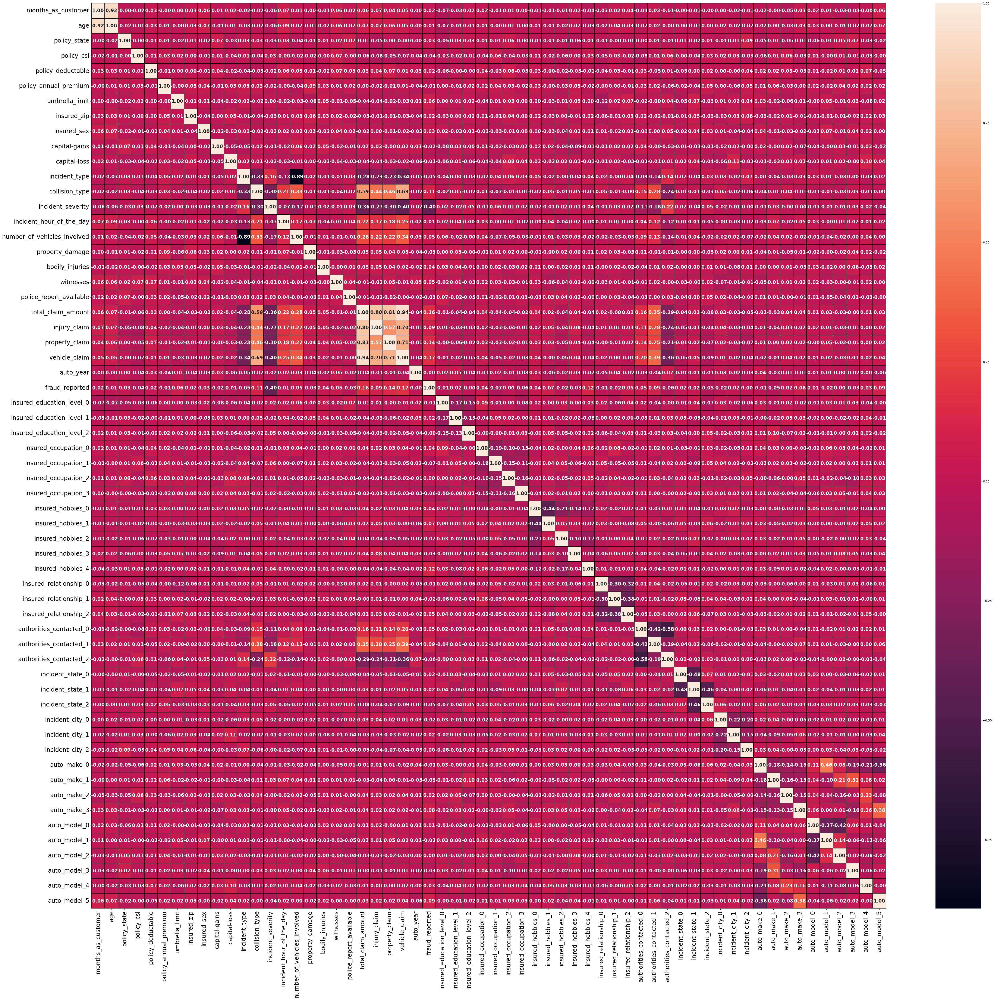

In [171]:
plt.figure(figsize=(60,55))
sns.heatmap(df.corr(),annot=True,fmt='.2f',linecolor='black',linewidth=0.2,annot_kws={'fontsize': 16,'fontweight': 'bold'})
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show() 

# Graphical depiction of the relationship between features and the target variable:

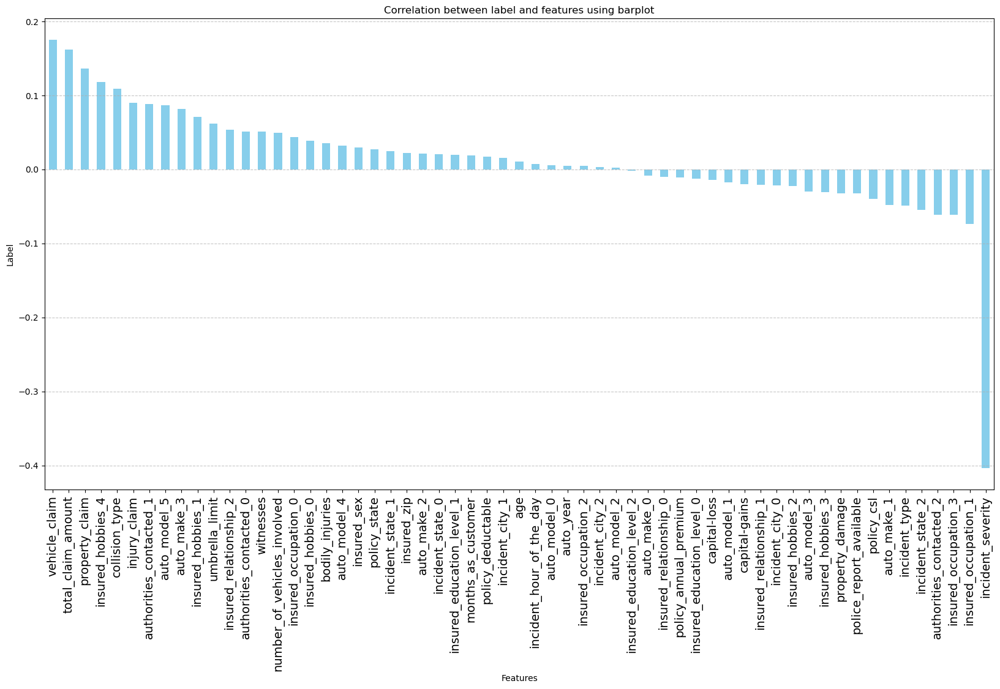

In [172]:
plt.figure(figsize=(20,10))
df.corr()['fraud_reported'].sort_values(ascending=False).drop(['fraud_reported']).plot(kind='bar', color='skyblue')
plt.xlabel('Features')
plt.ylabel('Label')
plt.xticks(fontsize=14)
plt.title('Correlation between label and features using barplot')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# observations:

1. Incident severity has the maximum negative correlation with the target variable.
2. Columns such as insured_sex, insured_zip, capital-loss, insured_education_level_0, auto_model_2, and incident_state_1 have the least correlation with the target variable.
3. Vehicle claim and total claim amount have a strong positive correlation with the target variable.

In [173]:
df

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,capital-gains,...,auto_make_0,auto_make_1,auto_make_2,auto_make_3,auto_model_0,auto_model_1,auto_model_2,auto_model_3,auto_model_4,auto_model_5
0,228,42,1,1,2000,1197.22,5.550473,4.266242,1,0,...,0,0,0,1,0,0,0,0,0,1
1,134,29,2,0,2000,1413.14,5.550473,4.226801,0,35100,...,0,0,1,0,0,0,0,0,1,0
2,256,41,0,1,2000,1415.74,5.664061,4.392029,0,48900,...,0,0,1,1,0,0,0,0,1,1
3,228,44,0,2,1000,1583.91,5.664061,4.394103,1,66000,...,0,1,0,0,0,0,0,1,0,0
4,256,39,2,1,1000,1351.10,0.000000,4.276550,0,0,...,0,1,0,1,0,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
994,3,38,2,2,1000,1310.80,0.000000,4.227517,0,0,...,1,1,0,1,1,0,0,0,0,0
995,285,41,0,0,1000,1436.79,0.000000,4.392078,0,70900,...,1,1,1,0,0,1,1,1,0,0
996,130,34,2,1,500,1383.49,5.244211,4.239904,0,35100,...,1,0,1,0,0,1,0,0,1,0
997,458,62,0,2,2000,1356.92,5.550473,4.238751,1,0,...,0,1,1,1,0,0,0,1,1,1


# Preparing Data for Machine Learning

# Splitting

Choose the dependent(label)and independent variables

In [174]:
X = df.drop('fraud_reported', axis=1)
Y = df['fraud_reported']

In [175]:
X

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,capital-gains,...,auto_make_0,auto_make_1,auto_make_2,auto_make_3,auto_model_0,auto_model_1,auto_model_2,auto_model_3,auto_model_4,auto_model_5
0,228,42,1,1,2000,1197.22,5.550473,4.266242,1,0,...,0,0,0,1,0,0,0,0,0,1
1,134,29,2,0,2000,1413.14,5.550473,4.226801,0,35100,...,0,0,1,0,0,0,0,0,1,0
2,256,41,0,1,2000,1415.74,5.664061,4.392029,0,48900,...,0,0,1,1,0,0,0,0,1,1
3,228,44,0,2,1000,1583.91,5.664061,4.394103,1,66000,...,0,1,0,0,0,0,0,1,0,0
4,256,39,2,1,1000,1351.10,0.000000,4.276550,0,0,...,0,1,0,1,0,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
994,3,38,2,2,1000,1310.80,0.000000,4.227517,0,0,...,1,1,0,1,1,0,0,0,0,0
995,285,41,0,0,1000,1436.79,0.000000,4.392078,0,70900,...,1,1,1,0,0,1,1,1,0,0
996,130,34,2,1,500,1383.49,5.244211,4.239904,0,35100,...,1,0,1,0,0,1,0,0,1,0
997,458,62,0,2,2000,1356.92,5.550473,4.238751,1,0,...,0,1,1,1,0,0,0,1,1,1


In [176]:
Y

0      1
1      0
2      1
3      0
4      1
      ..
994    0
995    0
996    0
997    0
998    0
Name: fraud_reported, Length: 994, dtype: int32

In [177]:
X.shape

(994, 59)

In [178]:
Y.shape

(994,)

# Feature Scaling

In [179]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)
X 

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,capital-gains,...,auto_make_0,auto_make_1,auto_make_2,auto_make_3,auto_model_0,auto_model_1,auto_model_2,auto_model_3,auto_model_4,auto_model_5
0,0.204933,0.330606,-0.016956,0.062518,1.410242,-0.249716,1.964969,-0.429804,1.075259,-0.898982,...,-0.970261,-0.966360,-1.049514,1.024444,-0.475024,-0.786697,-0.883947,-1.008081,-1.055885,1.024444
1,-0.612770,-1.092003,1.186952,-1.180347,1.410242,0.648628,1.964969,-1.034178,-0.930008,0.359416,...,-0.970261,-0.966360,0.952822,-0.976140,-0.475024,-0.786697,-0.883947,-1.008081,0.947073,-0.976140
2,0.448504,0.221175,-1.220865,0.062518,1.410242,0.659446,2.015402,1.497718,-0.930008,0.854171,...,-0.970261,-0.966360,0.952822,1.024444,-0.475024,-0.786697,-0.883947,-1.008081,0.947073,1.024444
3,0.204933,0.549469,-1.220865,1.305384,-0.223535,1.359124,2.015402,1.529495,1.075259,1.467236,...,-0.970261,1.034811,-1.049514,-0.976140,-0.475024,-0.786697,-0.883947,0.991984,-1.055885,-0.976140
4,0.448504,0.002312,1.186952,0.062518,-0.223535,0.390508,-0.499467,-0.271844,-0.930008,-0.898982,...,-0.970261,1.034811,-1.049514,1.024444,-0.475024,-0.786697,-0.883947,0.991984,-1.055885,1.024444
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
989,-1.752334,-0.107120,1.186952,1.305384,-0.223535,0.222839,-0.499467,-1.023205,-0.930008,-0.898982,...,1.030651,1.034811,-1.049514,1.024444,2.105159,-0.786697,-0.883947,-1.008081,-1.055885,-0.976140
990,0.700774,0.221175,-1.220865,-1.180347,-0.223535,0.747025,-0.499467,1.498456,-0.930008,1.642910,...,1.030651,1.034811,0.952822,-0.976140,-0.475024,1.271137,1.131290,0.991984,-1.055885,-0.976140
991,-0.647565,-0.544845,1.186952,0.062518,-1.040423,0.525268,1.828987,-0.833386,-0.930008,0.359416,...,1.030651,-0.966360,0.952822,-0.976140,-0.475024,1.271137,-0.883947,-1.008081,0.947073,-0.976140
992,2.205695,2.519236,-1.220865,1.305384,1.410242,0.414723,1.964969,-0.851061,1.075259,-0.898982,...,-0.970261,1.034811,0.952822,1.024444,-0.475024,-0.786697,-0.883947,0.991984,0.947073,1.024444


To address potential bias stemming from variations in decimal places across feature columns, I've opted to standardize all the features using the Standard Scaler method. This technique ensures that all feature columns have comparable scales, which can enhance the performance and stability of my model.

# Assessing multicollinearity among features.

In [180]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [181]:
vif=pd.DataFrame()
vif['VIF Values']=[variance_inflation_factor(X.values,i) for i in range(len(X.columns))]
vif['Features']=X.columns
vif

,VIF Values,Features
0,6.981340,months_as_customer
1,7.005222,age
2,1.065859,policy_state
3,1.062770,policy_csl
4,1.066145,policy_deductable
5,1.057968,policy_annual_premium
6,1.060754,umbrella_limit
7,1.041694,insured_zip
8,1.060667,insured_sex
9,1.062473,capital-gains


Based on the VIF scores and correlation analysis, we can observe that the VIF scores for the total_claim_amount and vehicle_claim columns are greater than the acceptable range of <10. Since the total_claim_amount column has a lower correlation with the target variable compared to the vehicle_claim column, we will drop the total_claim_amount column from the dataset.

In [182]:
X=X.drop(columns='total_claim_amount',axis=1)

In [184]:
vif=pd.DataFrame()
vif['VIF Values']=[variance_inflation_factor(X.values,i) for i in range(len(X.columns))]
vif['Features']=X.columns
vif

,VIF Values,Features
0,6.976230,months_as_customer
1,7.000679,age
2,1.065123,policy_state
3,1.058646,policy_csl
4,1.064327,policy_deductable
5,1.057065,policy_annual_premium
6,1.060689,umbrella_limit
7,1.041594,insured_zip
8,1.058622,insured_sex
9,1.062021,capital-gains


Now that the VIF score is within the acceptable range, we can proceed with model building.

In [185]:
Y.value_counts()

fraud_reported
0    749
1    245
Name: count, dtype: int64

In [186]:
from imblearn.over_sampling import SMOTE
sm=SMOTE()
X,Y=sm.fit_resample(X,Y)

In [187]:
Y.value_counts()

fraud_reported
1    749
0    749
Name: count, dtype: int64

Now that the data is balanced.

In [188]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import  r2_score
maxacc=0
maxrs=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(X,Y,test_size=0.30,random_state=i) 
    lr=LinearRegression()
    lr.fit(x_train,y_train)
    pred=lr.predict(x_test)
    acc=r2_score(y_test,pred)   
    if acc>maxacc:
        maxacc=acc
        maxrs=i
print('Best accuracy is', maxacc,'at random state',maxrs) 

Best accuracy is 0.351963397818737 at random state 76


# Creating the training and testing data sets

In [210]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=maxrs)

20% of the dataset will be used for testing, and the remaining 80% for training our machine learning models.

# Machine Learning Model for Classification and Evaluation Metrics

In [194]:
# Classification Model Function
from sklearn.metrics import confusion_matrix

def classify(model, X, Y):
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=121)
    
    # Training the model
    model.fit(X_train, Y_train)
    
    # Predicting Y_test
    pred = model.predict(X_test)
    
    # Accuracy Score
    acc_score = (accuracy_score(Y_test, pred))*100
    print("Accuracy Score:", acc_score)
    
    # Classification Report
    class_report = classification_report(Y_test, pred)
    print("\nClassification Report:\n", class_report)
    
    #Confusion Matrix
    confusion_matx=confusion_matrix(Y_test, pred)
    print("\nConfusion Matrix:\n",confusion_matx)
    
    # Cross Validation Score
    cv_score = (cross_val_score(model, X, Y, cv=5).mean())*100
    print("\nCross Validation Score:", cv_score)
    
    # Result of accuracy minus cv scores
    result = acc_score - cv_score
    print("\nAccuracy Score - Cross Validation Score is", result)

In [195]:
# Logistic Regression

model=LogisticRegression()
classify(model, X, Y)

Accuracy Score: 76.0

Classification Report:
               precision    recall  f1-score   support

           0       0.81      0.70      0.75       154
           1       0.72      0.82      0.77       146

    accuracy                           0.76       300
   macro avg       0.76      0.76      0.76       300
weighted avg       0.77      0.76      0.76       300


Confusion Matrix:
 [[108  46]
 [ 26 120]]

Cross Validation Score: 75.6361204013378

Accuracy Score - Cross Validation Score is 0.3638795986621943


In [196]:
# Random Forest Classifier

model=RandomForestClassifier(max_depth=15, random_state=111)
classify(model, X, Y)

Accuracy Score: 89.33333333333333

Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.91      0.90       154
           1       0.90      0.88      0.89       146

    accuracy                           0.89       300
   macro avg       0.89      0.89      0.89       300
weighted avg       0.89      0.89      0.89       300


Confusion Matrix:
 [[140  14]
 [ 18 128]]

Cross Validation Score: 88.26064659977703

Accuracy Score - Cross Validation Score is 1.0726867335562957


In [197]:
# Extra Trees Classifier

model=ExtraTreesClassifier()
classify(model, X, Y)

Accuracy Score: 92.33333333333333

Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.92      0.93       154
           1       0.92      0.92      0.92       146

    accuracy                           0.92       300
   macro avg       0.92      0.92      0.92       300
weighted avg       0.92      0.92      0.92       300


Confusion Matrix:
 [[142  12]
 [ 11 135]]

Cross Validation Score: 93.19531772575249

Accuracy Score - Cross Validation Score is -0.8619843924191599


In [198]:
# K Neighbors Classifier

model=KNeighborsClassifier(n_neighbors=15)
classify(model, X, Y)

Accuracy Score: 53.333333333333336

Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.10      0.19       154
           1       0.51      0.99      0.67       146

    accuracy                           0.53       300
   macro avg       0.70      0.55      0.43       300
weighted avg       0.70      0.53      0.42       300


Confusion Matrix:
 [[ 16 138]
 [  2 144]]

Cross Validation Score: 56.47692307692307

Accuracy Score - Cross Validation Score is -3.143589743589736


In [199]:
# Support Vector Classifier

model=SVC(C=1.0, kernel='rbf', gamma='auto', random_state=42)
classify(model, X, Y)

Accuracy Score: 87.33333333333333

Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.88      0.88       154
           1       0.87      0.87      0.87       146

    accuracy                           0.87       300
   macro avg       0.87      0.87      0.87       300
weighted avg       0.87      0.87      0.87       300


Confusion Matrix:
 [[135  19]
 [ 19 127]]

Cross Validation Score: 89.65886287625418

Accuracy Score - Cross Validation Score is -2.3255295429208473


In [200]:
# Decision Tree Classifier

model=DecisionTreeClassifier(random_state=21, max_depth=15)
classify(model, X, Y)

Accuracy Score: 86.66666666666667

Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.85      0.87       154
           1       0.85      0.88      0.87       146

    accuracy                           0.87       300
   macro avg       0.87      0.87      0.87       300
weighted avg       0.87      0.87      0.87       300


Confusion Matrix:
 [[131  23]
 [ 17 129]]

Cross Validation Score: 84.3190635451505

Accuracy Score - Cross Validation Score is 2.3476031215161726


In [201]:
# XGB Classifier

model=xgb.XGBClassifier(verbosity=0)
classify(model, X, Y)

Accuracy Score: 92.0

Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.90      0.92       154
           1       0.90      0.94      0.92       146

    accuracy                           0.92       300
   macro avg       0.92      0.92      0.92       300
weighted avg       0.92      0.92      0.92       300


Confusion Matrix:
 [[139  15]
 [  9 137]]

Cross Validation Score: 88.2593088071349

Accuracy Score - Cross Validation Score is 3.7406911928651


# The Extra Trees Classifier is deemed our best model because it exhibits the smallest difference between the accuracy score and the cross-validation score.

# Hyper parameter tuning on the best ML Model

In [211]:
# ExtraTrees Classifier
from sklearn.model_selection import GridSearchCV

param_grid ={'criterion':['gini','entropy'],
           'random_state':[10,50,1000],
           'max_depth':[0,10,20],
           'n_jobs':[-2,-1,1],
           'n_estimators':[50,100,200,300]}

In [212]:
ETC=ExtraTreesClassifier()

In [213]:
grid_search= GridSearchCV(estimator=ETC, param_grid=param_grid, cv=5)

In [214]:
grid_search.fit(X_train, Y_train)

GridSearchCV(cv=5, estimator=ExtraTreesClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [0, 10, 20],
                         'n_estimators': [50, 100, 200, 300],
                         'n_jobs': [-2, -1, 1],
                         'random_state': [10, 50, 1000]})

In [215]:
grid_search.best_params_

{'criterion': 'entropy',
 'max_depth': 20,
 'n_estimators': 300,
 'n_jobs': -2,
 'random_state': 10}

In [216]:
final_model_2=ExtraTreesClassifier(criterion='entropy',max_depth=20,n_estimators=300,n_jobs=-2,random_state=10)

In [217]:
final_model_2.fit(X_train,Y_train)
pred=final_model_2.predict(X_test)
acc=accuracy_score(Y_test,pred)
print(acc*100)

95.33333333333334


# Saving the model

In [218]:
import joblib

filename = "FinalModel_2_7.pkl"
joblib.dump(final_model_2, filename)

['FinalModel_2_7.pkl']

In [219]:
model=joblib.load("FinalModel_2_7.pkl")

prediction=model.predict(X_test)
prediction

array([0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1,
       0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0,
       0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0,
       0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1,
       0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0,
       1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0,
       1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0,
       1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1,
       1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0,
       1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1,
       0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1])

In [223]:
a=np.array(Y_test)
df=pd.DataFrame()
df['Predicted']=prediction
df['Original']=a
df.head()

,Predicted,Original
0,0,0
1,0,0
2,0,0
3,0,0
4,1,1


In [224]:
df.tail()

,Predicted,Original
295,0,0
296,1,1
297,0,0
298,1,1
299,1,1


---

---

In [ ]:
# Model II:-Feature selection with Select-K best method

In [226]:
X

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,capital-gains,...,auto_make_0,auto_make_1,auto_make_2,auto_make_3,auto_model_0,auto_model_1,auto_model_2,auto_model_3,auto_model_4,auto_model_5
0,0.204933,0.330606,-0.016956,0.062518,1.410242,-0.249716,1.964969,-0.429804,1.075259,-0.898982,...,-0.970261,-0.966360,-1.049514,1.024444,-0.475024,-0.786697,-0.883947,-1.008081,-1.055885,1.024444
1,-0.612770,-1.092003,1.186952,-1.180347,1.410242,0.648628,1.964969,-1.034178,-0.930008,0.359416,...,-0.970261,-0.966360,0.952822,-0.976140,-0.475024,-0.786697,-0.883947,-1.008081,0.947073,-0.976140
2,0.448504,0.221175,-1.220865,0.062518,1.410242,0.659446,2.015402,1.497718,-0.930008,0.854171,...,-0.970261,-0.966360,0.952822,1.024444,-0.475024,-0.786697,-0.883947,-1.008081,0.947073,1.024444
3,0.204933,0.549469,-1.220865,1.305384,-0.223535,1.359124,2.015402,1.529495,1.075259,1.467236,...,-0.970261,1.034811,-1.049514,-0.976140,-0.475024,-0.786697,-0.883947,0.991984,-1.055885,-0.976140
4,0.448504,0.002312,1.186952,0.062518,-0.223535,0.390508,-0.499467,-0.271844,-0.930008,-0.898982,...,-0.970261,1.034811,-1.049514,1.024444,-0.475024,-0.786697,-0.883947,0.991984,-1.055885,1.024444
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1493,2.061708,2.236887,1.186952,0.824693,0.092405,0.291134,-0.499467,1.432814,-0.930008,0.945568,...,-0.970261,-0.579374,0.952822,0.637571,-0.475024,0.873193,1.131290,0.991984,-0.668553,1.024444
1494,0.029508,0.086219,-1.220865,0.794465,-0.704616,0.387207,0.916343,-0.395576,0.250931,-0.898982,...,1.030651,-0.966360,0.952822,1.024444,2.105159,-0.786697,-0.883947,-1.008081,-1.055885,1.024444
1495,0.006533,-0.162906,-0.016956,-1.053628,-0.223535,0.444722,1.713703,1.177616,-0.725558,-0.898982,...,0.826644,1.034811,-1.049514,-0.772167,1.842092,-0.576887,-0.678480,0.991984,0.947073,1.024444
1496,-0.392588,-0.435717,-0.782777,0.400855,1.410242,0.693117,1.029799,0.789838,1.075259,-0.898982,...,-0.970261,-0.238157,0.952822,1.024444,-0.475024,-0.786697,-0.883947,-0.280281,0.947073,1.024444


In [227]:
X.shape

(1498, 58)

In [228]:
Y

0       1
1       0
2       1
3       0
4       1
       ..
1493    1
1494    1
1495    1
1496    1
1497    1
Name: fraud_reported, Length: 1498, dtype: int32

In [229]:
Y.shape

(1498,)

In [230]:
from sklearn.feature_selection import SelectKBest,f_classif

In [231]:
best_features=SelectKBest(score_func=f_classif,k=58) 

fit=best_features.fit(X,Y)
df_scores=pd.DataFrame(fit.scores_)   
df_columns=pd.DataFrame(X.columns) 



feature_score= pd.concat([df_scores,df_columns],axis=1)
feature_score.columns=['score','feature_name']  

print(feature_score.nlargest(35,'score'))

         score                 feature_name
13  438.506478            incident_severity
22   72.509376                vehicle_claim
21   37.853508               property_claim
35   36.052850            insured_hobbies_4
12   28.908873               collision_type
40   21.585161      authorities_contacted_1
20   15.083510                 injury_claim
51   12.622743                  auto_make_3
28   12.036865         insured_occupation_1
57    9.869051                 auto_model_5
44    9.147968             incident_state_2
6     8.232596               umbrella_limit
18    8.222846                    witnesses
41    7.264645      authorities_contacted_2
32    6.445128            insured_hobbies_1
30    6.251461         insured_occupation_3
15    6.109921  number_of_vehicles_involved
11    5.732108                incident_type
8     5.150803                  insured_sex
42    5.097157             incident_state_0
39    4.382186      authorities_contacted_0
2     4.210178                 p

In [232]:
X2=X

In [237]:
X=X[ ['incident_severity', 'vehicle_claim', 'property_claim', 'insured_hobbies_4', 
            'collision_type', 'authorities_contacted_1', 'injury_claim', 'auto_make_3', 
            'insured_occupation_1', 'auto_model_5', 'incident_state_2', 'umbrella_limit', 
            'witnesses', 'authorities_contacted_2', 'insured_hobbies_1', 'insured_occupation_3', 
            'number_of_vehicles_involved', 'incident_type', 'insured_sex', 'incident_state_0', 
            'authorities_contacted_0', 'policy_state', 'property_damage', 'auto_model_4', 
            'insured_relationship_2', 'policy_csl', 'auto_make_1', 'insured_occupation_0', 
            'incident_city_0', 'capital-gains', 'insured_hobbies_0', 'insured_zip', 
            'auto_model_3', 'insured_education_level_1', 'insured_hobbies_3']]

In [238]:
X

,incident_severity,vehicle_claim,property_claim,insured_hobbies_4,collision_type,authorities_contacted_1,injury_claim,auto_make_3,insured_occupation_1,auto_model_5,...,policy_csl,auto_make_1,insured_occupation_0,incident_city_0,capital-gains,insured_hobbies_0,insured_zip,auto_model_3,insured_education_level_1,insured_hobbies_3
0,-0.197191,-2.110364,-1.378503,0.989990,-1.569891,-0.853637,-1.364999,1.024444,-0.954745,1.024444,...,0.062518,-0.966360,-0.915062,-1.140581,-0.898982,-0.526911,-0.429804,-1.008081,-1.115254,-0.968309
1,-0.197191,-0.276938,-0.738013,-1.010111,0.313599,-0.853637,0.054126,-0.976140,-0.954745,-0.976140,...,-1.180347,-0.966360,-0.915062,-1.140581,0.359416,-0.526911,-1.034178,-1.008081,0.896656,1.032728
2,-1.262452,0.609416,-0.218527,-1.010111,-0.628146,-0.853637,-0.224777,1.024444,-0.954745,1.024444,...,0.062518,-0.966360,-0.915062,-1.140581,0.854171,-0.526911,1.497718,-1.008081,0.896656,1.032728
3,-0.197191,-1.880055,-1.405625,-1.010111,-1.569891,-0.853637,-1.258359,-0.976140,-0.954745,-0.976140,...,1.305384,1.034811,-0.915062,-1.140581,1.467236,-0.526911,1.529495,0.991984,0.896656,1.032728
4,-1.262452,0.622347,-0.203923,0.989990,0.313599,1.171459,-0.210421,1.024444,1.047400,1.024444,...,0.062518,1.034811,-0.915062,-1.140581,-0.898982,-0.526911,-0.271844,0.991984,0.896656,1.032728
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1493,-0.403191,0.744511,1.514029,0.603210,-0.628146,1.171459,-0.023342,0.637571,-0.954745,1.024444,...,0.824693,-0.579374,-0.526777,-1.140581,0.945568,1.428954,1.432814,0.991984,0.896656,0.645768
1494,-1.262452,0.311326,-0.408411,0.989990,0.481077,0.338979,0.702104,1.024444,1.047400,1.024444,...,0.794465,-0.966360,-0.915062,0.047460,-0.898982,-0.526911,-0.395576,-1.008081,-1.115254,0.210139
1495,0.650849,0.278588,0.734131,-0.806188,0.313599,-0.853637,1.829965,-0.772167,1.047400,1.024444,...,-1.053628,1.034811,-0.915062,-0.934902,-0.898982,-0.526911,1.177616,0.991984,0.896656,1.032728
1496,-1.262452,0.338487,0.504163,0.989990,0.569964,1.171459,0.085617,1.024444,-0.226188,1.024444,...,0.400855,-0.238157,1.092822,0.142664,-0.898982,-0.526911,0.789838,-0.280281,0.896656,1.032728


In [239]:
X.shape

(1498, 35)

In [240]:
Y.shape

(1498,)

In [241]:
vif=pd.DataFrame()
vif['VIF Values']=[variance_inflation_factor(X.values,i) for i in range(len(X.columns))]
vif['Features']=X.columns
vif

,VIF Values,Features
0,1.290348,incident_severity
1,4.549775,vehicle_claim
2,2.036584,property_claim
3,1.062108,insured_hobbies_4
4,1.988940,collision_type
5,2.476878,authorities_contacted_1
6,1.981873,injury_claim
7,1.380126,auto_make_3
8,1.130916,insured_occupation_1
9,1.291624,auto_model_5


In [242]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import  r2_score
maxacc=0
maxrs=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(X,Y,test_size=0.30,random_state=i) 
    lr=LinearRegression()
    lr.fit(x_train,y_train)
    pred=lr.predict(x_test)
    acc=r2_score(y_test,pred)   
    if acc>maxacc:
        maxacc=acc
        maxrs=i
print('Best accuracy is', maxacc,'at random state',maxrs) 

Best accuracy is 0.36094236550793923 at random state 105


# Machine Learning Model for Classification and Evaluation Metrics

In [244]:
# Classification Model Function

def classify(model, X, Y):
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=121)
    
    # Training the model
    model.fit(X_train, Y_train)
    
    # Predicting Y_test
    pred = model.predict(X_test)
    
    # Accuracy Score
    acc_score = (accuracy_score(Y_test, pred))*100
    print("Accuracy Score:", acc_score)
    
    # Classification Report
    class_report = classification_report(Y_test, pred)
    print("\nClassification Report:\n", class_report)
    
    #Confusion Matrix
    confusion_matx=confusion_matrix(Y_test, pred)
    print("\nConfusion Matrix:\n",confusion_matx)
    
    # Cross Validation Score
    cv_score = (cross_val_score(model, X, Y, cv=5).mean())*100
    print("\nCross Validation Score:", cv_score)
    
    # Result of accuracy minus cv scores
    result = acc_score - cv_score
    print("\nAccuracy Score - Cross Validation Score is", result)

In [245]:
# Logistic Regression

model=LogisticRegression()
classify(model, X, Y)

Accuracy Score: 79.0

Classification Report:
               precision    recall  f1-score   support

           0       0.82      0.76      0.79       154
           1       0.76      0.82      0.79       146

    accuracy                           0.79       300
   macro avg       0.79      0.79      0.79       300
weighted avg       0.79      0.79      0.79       300


Confusion Matrix:
 [[117  37]
 [ 26 120]]

Cross Validation Score: 76.43545150501672

Accuracy Score - Cross Validation Score is 2.564548494983285


In [246]:
# Random Forest Classifier

model=RandomForestClassifier(max_depth=15, random_state=111)
classify(model, X, Y)

Accuracy Score: 87.33333333333333

Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.90      0.88       154
           1       0.89      0.84      0.87       146

    accuracy                           0.87       300
   macro avg       0.87      0.87      0.87       300
weighted avg       0.87      0.87      0.87       300


Confusion Matrix:
 [[139  15]
 [ 23 123]]

Cross Validation Score: 88.46064659977702

Accuracy Score - Cross Validation Score is -1.127313266443693


In [247]:
# Extra Trees Classifier

model=ExtraTreesClassifier()
classify(model, X, Y)

Accuracy Score: 92.33333333333333

Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.92      0.93       154
           1       0.92      0.92      0.92       146

    accuracy                           0.92       300
   macro avg       0.92      0.92      0.92       300
weighted avg       0.92      0.92      0.92       300


Confusion Matrix:
 [[142  12]
 [ 11 135]]

Cross Validation Score: 92.66243032329989

Accuracy Score - Cross Validation Score is -0.32909698996655834


In [248]:
# K Neighbors Classifier

model=KNeighborsClassifier(n_neighbors=15)
classify(model, X, Y)

Accuracy Score: 59.66666666666667

Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.25      0.39       154
           1       0.55      0.96      0.70       146

    accuracy                           0.60       300
   macro avg       0.71      0.61      0.55       300
weighted avg       0.71      0.60      0.54       300


Confusion Matrix:
 [[ 39 115]
 [  6 140]]

Cross Validation Score: 62.7505016722408

Accuracy Score - Cross Validation Score is -3.08383500557413


In [249]:
# Support Vector Classifier

model=SVC(C=1.0, kernel='rbf', gamma='auto', random_state=42)
classify(model, X, Y)

Accuracy Score: 88.33333333333333

Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.87      0.88       154
           1       0.87      0.90      0.88       146

    accuracy                           0.88       300
   macro avg       0.88      0.88      0.88       300
weighted avg       0.88      0.88      0.88       300


Confusion Matrix:
 [[134  20]
 [ 15 131]]

Cross Validation Score: 88.45641025641025

Accuracy Score - Cross Validation Score is -0.12307692307692264


In [250]:
# Decision Tree Classifier

model=DecisionTreeClassifier(random_state=21, max_depth=15)
classify(model, X, Y)

Accuracy Score: 85.0

Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.81      0.85       154
           1       0.82      0.89      0.85       146

    accuracy                           0.85       300
   macro avg       0.85      0.85      0.85       300
weighted avg       0.85      0.85      0.85       300


Confusion Matrix:
 [[125  29]
 [ 16 130]]

Cross Validation Score: 82.18327759197324

Accuracy Score - Cross Validation Score is 2.816722408026763


In [251]:
# XGB Classifier

model=xgb.XGBClassifier(verbosity=0)
classify(model, X, Y)

Accuracy Score: 86.33333333333333

Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.83      0.86       154
           1       0.83      0.90      0.86       146

    accuracy                           0.86       300
   macro avg       0.86      0.86      0.86       300
weighted avg       0.87      0.86      0.86       300


Confusion Matrix:
 [[128  26]
 [ 15 131]]

Cross Validation Score: 86.123745819398

Accuracy Score - Cross Validation Score is 0.20958751393533248


# The Extra Trees Classifier is deemed our best model because it exhibits the smallest difference between the accuracy score and the cross-validation score.

# Hyper parameter tuning on the best ML Model

In [252]:
# ExtraTrees Classifier
from sklearn.model_selection import GridSearchCV

param_grid ={'criterion':['gini','entropy'],
           'random_state':[10,50,1000],
           'max_depth':[0,10,20],
           'n_jobs':[-2,-1,1],
           'n_estimators':[50,100,200,300]}

In [253]:
ETC=ExtraTreesClassifier()

In [254]:
grid_search= GridSearchCV(estimator=ETC, param_grid=param_grid, cv=5)

In [255]:
grid_search.fit(X_train, Y_train)

GridSearchCV(cv=5, estimator=ExtraTreesClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [0, 10, 20],
                         'n_estimators': [50, 100, 200, 300],
                         'n_jobs': [-2, -1, 1],
                         'random_state': [10, 50, 1000]})

In [257]:
grid_search.best_params_

{'criterion': 'entropy',
 'max_depth': 20,
 'n_estimators': 300,
 'n_jobs': -2,
 'random_state': 10}

In [258]:
final_model_2=ExtraTreesClassifier(criterion='entropy',max_depth=20,n_estimators=300,n_jobs=-2,random_state=10)

In [259]:
final_model_2.fit(X_train,Y_train)
pred=final_model_2.predict(X_test)
acc=accuracy_score(Y_test,pred)
print(acc*100)

95.33333333333334


# Saving the model

In [260]:
import joblib

filename = "FinalModel_2_8.pkl"
joblib.dump(final_model_2, filename)

['FinalModel_2_8.pkl']

In [261]:
model=joblib.load("FinalModel_2_8.pkl")

prediction=model.predict(X_test)
prediction

array([0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1,
       0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0,
       0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0,
       0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1,
       0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0,
       1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0,
       1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0,
       1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1,
       1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0,
       1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1,
       0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1])

In [262]:
a=np.array(Y_test)
df=pd.DataFrame()
df['Predicted']=prediction
df['Original']=a
df.head()

,Predicted,Original
0,0,0
1,0,0
2,0,0
3,0,0
4,1,1


In [263]:
df.tail()

,Predicted,Original
295,0,0
296,1,1
297,0,0
298,1,1
299,1,1


# Conclusion:

# Binary Classification Objective: Develop a predictive model to classify insurance claims as fraudulent or not fraudulent.

In [1]:
# Model-I achieves an accuracy of 95% with ExtraTrees Classifier.
# Model-II achieves an accuracy of ~96% with ExtraTrees Classifier Feature selection with Select-K best method .